# CAPSTONE PROJECT-3:-PRCP-1004-Fifa 20 
# PROJECT TEAM ID:-PTID-CDS-APR-24-1899

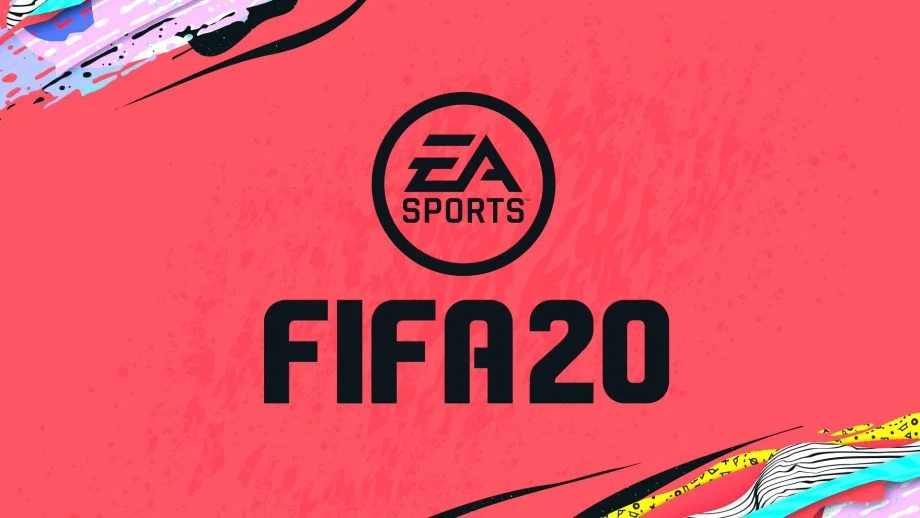

# BUSINESS CASE

Football is one of the popular sports in the world. The aim of football is to score more goals then your opponent in a 90 minute playing time frame. Each team consists
of 11 players. These are made up of one goalkeeper and ten outfield players. Players must use their feet to kick the ball and are prohibited to use their hands apart from
goalkeepers who can use any part of their body within the 18 yard box. All of the 11 players should acquire a few essential skills to become a professional footballer.
Those skills are dribbling, passing, shooting, defending the goal, to head the ball, juggle the ball, using both their feet efficiently etc., Also, knowing the opponent team
players' skill is essential to play effective football to increase the winning rate of the games. FIFA 20 is a football simulation video game published by Electronic Arts as
part of the FIFA series. EA sports data was fetched from SoFIFA, which is a database and forum. Every player in a FIFA Career Mode is included on SoFIFA’s database. It
has provided data of different football players across like players' full name, age, height, weight, their position in the team, rating of their skills like dribble, goal keeping,
passing, their mental strength, their ranking with respect to each player's playing position etc., using which we can cluster the players via various skills and attributes.

# Importing some basic libraries and reading thr dataset

In [124]:
#importing basic libraries
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
from statistics import mean
from sklearn.metrics import classification_report, accuracy_score
from pandas.plotting import scatter_matrix
import warnings
warnings.filterwarnings('ignore')
from math import sqrt
import scipy.stats
from pylab import rcParams
rcParams['figure.figsize'] = 15, 15

# LOAD DATA

### Let us now load the data and story it as a pandas dataframe. Here we are displaying the first 5 rows of our dataframe.

In [125]:
data =pd.read_csv("players_20.csv")

In [126]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


# Data exploration

In [127]:
data.shape

(18278, 104)

In [128]:
print("The number of rows in the dataset are:", data.shape[0])
print("The number of columns in the dataset are:", data.shape[1])

The number of rows in the dataset are: 18278
The number of columns in the dataset are: 104


###### Now let us print the column names and find out what the 104 features are.

In [129]:
# To print all the columns
list(data.columns)

['sofifa_id',
 'player_url',
 'short_name',
 'long_name',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'nationality',
 'club',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'player_positions',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'player_tags',
 'team_position',
 'team_jersey_number',
 'loaned_from',
 'joined',
 'contract_valid_until',
 'nation_position',
 'nation_jersey_number',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'player_traits',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agility',
 'movement_re

##### Displaying some information about the dataset

In [130]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


###### From the above line we infer the data types of our features.
###### data types: float64(16), int64(45), object(43)
###### We must note that we need to deal with object data types as numeric data is preferred for training models well.

#### Now let us analyse the statistical description of our data.

In [131]:
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


##### We can make the following observations:
##### • outliers in columns like age, value_eur, wage_eur, international_reputation, etc
##### • All features have different value scales.

### Unique Columns

In [132]:
num_unique_col=data.nunique()
print(num_unique_col)
print("Total no of columns contain unique values :",len(num_unique_col))

sofifa_id     18278
player_url    18278
short_name    17354
long_name     18218
age              27
              ...  
lb               96
lcb             110
cb              110
rcb             110
rb               96
Length: 104, dtype: int64
Total no of columns contain unique values : 104


In [133]:
unique_values=data.apply(pd.Series.unique)
unique_values


sofifa_id     [158023, 20801, 190871, 200389, 183277, 192985...
player_url    [https://sofifa.com/player/158023/lionel-messi...
short_name    [L. Messi, Cristiano Ronaldo, Neymar Jr, J. Ob...
long_name     [Lionel Andrés Messi Cuccittini, Cristiano Ron...
age           [32, 34, 27, 26, 28, 33, 20, 25, 31, 30, 24, 2...
                                    ...                        
lb            [63+2, 61+3, nan, 73+3, 81+3, 79+3, 66+3, 63+3...
lcb           [52+2, 53+3, 46+3, nan, 49+3, 66+3, 87+3, 72+3...
cb            [52+2, 53+3, 46+3, nan, 49+3, 66+3, 87+3, 72+3...
rcb           [52+2, 53+3, 46+3, nan, 49+3, 66+3, 87+3, 72+3...
rb            [63+2, 61+3, nan, 73+3, 81+3, 79+3, 66+3, 63+3...
Length: 104, dtype: object

## Data Cleaning


##### Let us remove some redundant features that wont be required for Data Analysis.


In [134]:
#removing redundant columns
redundant_columns =['sofifa_id','dob','player_url','long_name','body_type','real_face','nation_position','loaned_from','nation_jersey_number']

data=data.drop(redundant_columns , axis=1)

### Now we have new dataset

In [135]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


##### We remove nine redundant columns which is not going to contribute in our analysis.

In [136]:

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


#### Now let us analyse the statistical description of our data.

In [137]:
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


### Information about columns of dataset

In [138]:
data_col_all=list(data.columns)
data_col_flt=list(data.select_dtypes('float').columns)
data_col_int=list(data.select_dtypes('integer').columns)
data_col_obj=list(data.select_dtypes('object').columns)

### Information about columns of datatype float

In [139]:
print(data[data_col_flt].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   release_clause_eur    16980 non-null  float64
 1   team_jersey_number    18038 non-null  float64
 2   contract_valid_until  18038 non-null  float64
 3   nation_jersey_number  1126 non-null   float64
 4   pace                  16242 non-null  float64
 5   shooting              16242 non-null  float64
 6   passing               16242 non-null  float64
 7   dribbling             16242 non-null  float64
 8   defending             16242 non-null  float64
 9   physic                16242 non-null  float64
 10  gk_diving             2036 non-null   float64
 11  gk_handling           2036 non-null   float64
 12  gk_kicking            2036 non-null   float64
 13  gk_reflexes           2036 non-null   float64
 14  gk_speed              2036 non-null   float64
 15  gk_positioning     

###### 1) All 15 features of datatype float have null values 
###### 2) These null values will be corrected appropriately in the data pre-processing section

### Information about columns of datatype integer

In [140]:
print(data[data_col_int].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 45 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   sofifa_id                   18278 non-null  int64
 1   age                         18278 non-null  int64
 2   height_cm                   18278 non-null  int64
 3   weight_kg                   18278 non-null  int64
 4   overall                     18278 non-null  int64
 5   potential                   18278 non-null  int64
 6   value_eur                   18278 non-null  int64
 7   wage_eur                    18278 non-null  int64
 8   international_reputation    18278 non-null  int64
 9   weak_foot                   18278 non-null  int64
 10  skill_moves                 18278 non-null  int64
 11  attacking_crossing          18278 non-null  int64
 12  attacking_finishing         18278 non-null  int64
 13  attacking_heading_accuracy  18278 non-null  int64
 14  attack

##### None of the 45 features of datatype integer have null values

#### Information about columns of datatype object

In [141]:
print(data[data_col_obj].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   player_url        18278 non-null  object
 1   short_name        18278 non-null  object
 2   long_name         18278 non-null  object
 3   dob               18278 non-null  object
 4   nationality       18278 non-null  object
 5   club              18278 non-null  object
 6   player_positions  18278 non-null  object
 7   preferred_foot    18278 non-null  object
 8   work_rate         18278 non-null  object
 9   body_type         18278 non-null  object
 10  real_face         18278 non-null  object
 11  player_tags       1499 non-null   object
 12  team_position     18038 non-null  object
 13  loaned_from       1048 non-null   object
 14  joined            16990 non-null  object
 15  nation_position   1126 non-null   object
 16  player_traits     7566 non-null   object
 17  ls          

##### 30 out of 36 features of datatype object has null values

### Describe the dataset and it's features

### Key description\statistics of features of datatype float

In [142]:
data.describe(include='float')

,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning
count,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000
mean,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754
std,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876
min,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000
25%,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000
50%,1.200000e+06,17.000000,2021.000000,12.000000,69.000000,54.000000,58.000000,64.000000,56.000000,66.000000,65.000000,63.000000,61.000000,66.000000,39.000000,64.000000
75%,3.700000e+06,27.000000,2022.000000,18.000000,75.000000,63.000000,64.000000,69.000000,65.000000,72.000000,70.000000,68.000000,66.000000,72.000000,46.000000,69.000000
max,1.958000e+08,99.000000,2026.000000,30.000000,96.000000,93.000000,92.000000,96.000000,90.000000,90.000000,90.000000,92.000000,93.000000,92.000000,65.000000,91.000000


#### 1) None of the features have zero values 
#### 2) The values are in different scale(ones to thousands and more). We need to scale them before creating the model

### Key description\statistics of features of datatype integer

In [143]:
data.describe(include='integer')

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000


###### 1) Few features have zero values 
###### 2) The values are in different scale(ones to thousands and more). We need to scale them before creating the model


### Key description\statistics of columns of datatype object

In [144]:
data.describe(include='O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,...,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,...,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,...,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,...,682,636,636,636,682,667,621,621,621,667


###### 1) We have more data about players from England and FC Barcelona 
###### 2) Around (a) 87% of players do not have their real face in the FIFA 20 simulation game (b) 57% of players have normal body type (c) 42% of players are pre-dominantly substitues 
###### 3) Majority of the players have their rankings in the 60s range for their various positional skills(strikcer, left winger etc.,)

### Check for duplicate data

In [145]:
data.duplicated().sum()

0

###### No duplicate data present in the dataset

### Now let us find the missing values of different columns(features).

In [146]:
null_data = data.isna().sum().sort_values(ascending=False)
null_data = null_data.reset_index(drop = False)
null_data = null_data.rename(columns={"index": "Columns", 0:"Value"})
null_data['proportion'] = (null_data['Value']/len(data))*100
null_data.head()


,Columns,Value,proportion
0,loaned_from,17230,94.266331
1,nation_position,17152,93.839589
2,nation_jersey_number,17152,93.839589
3,player_tags,16779,91.798884
4,gk_speed,16242,88.860926


### Now let us plot the percentage of missing values to understand it better.

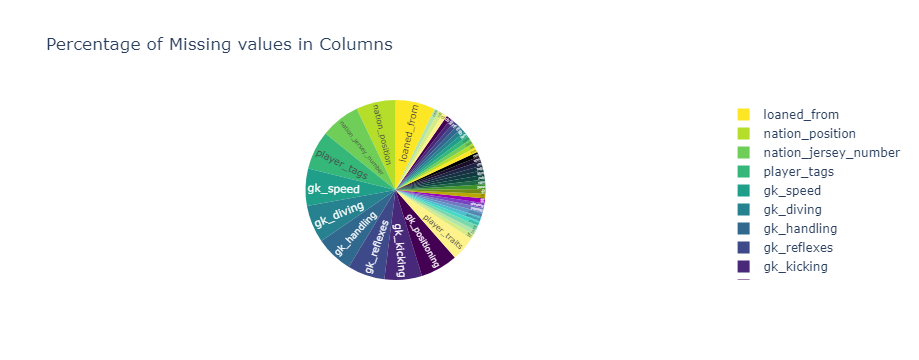

In [147]:
missing = null_data[null_data['proportion']>10]
fig = px.pie(missing, names='Columns', values='proportion',
 color_discrete_sequence=px.colors.sequential.Viridis_r,
 title='Percentage of Missing values in Columns')
fig.update_traces(textposition='inside', textinfo='label')
fig.show()

### We will analyse the few features from the dataset as listed below

In [148]:
# First we will analyse a few of the features
data_histo=data[['short_name', 'age', 'height_cm', 'weight_kg', 'nationality', 'club',
 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions',
 'preferred_foot', 'international_reputation', 'weak_foot',
 'skill_moves','release_clause_eur']]

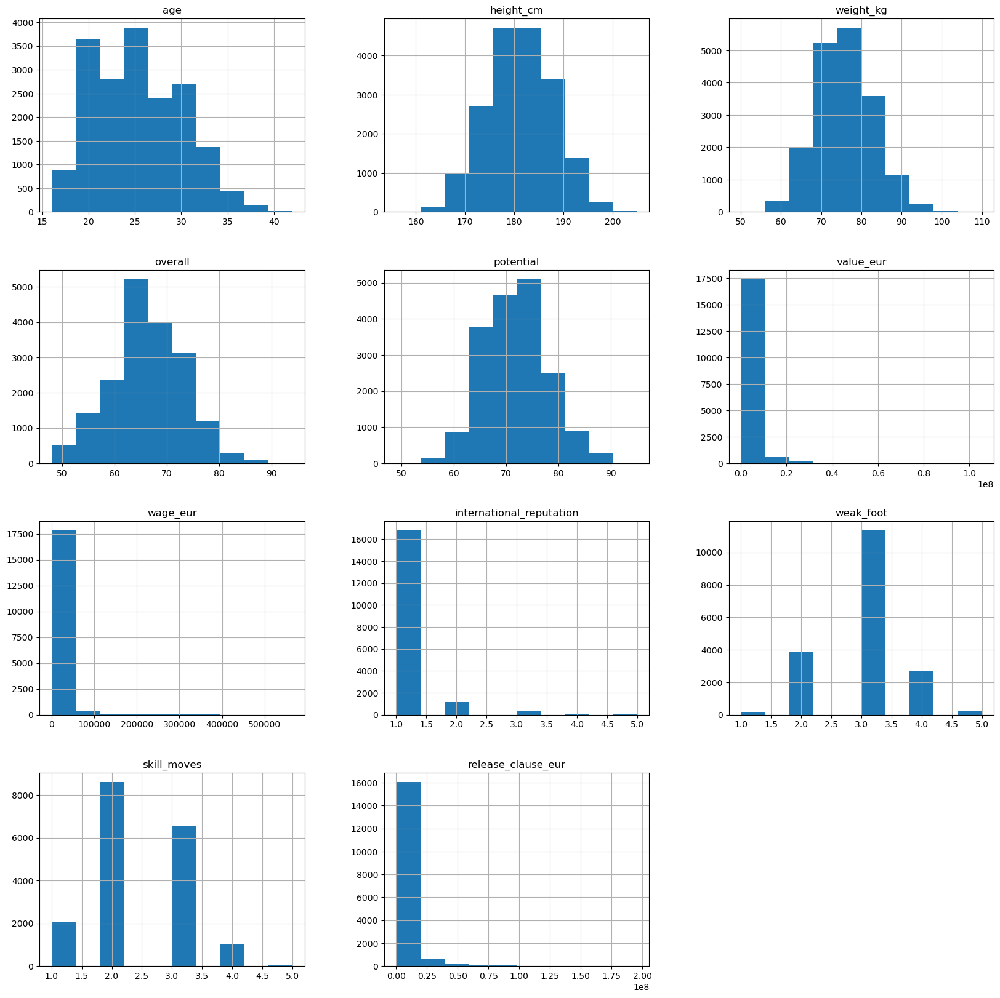

In [149]:
data_histo.hist(figsize=(20,20))
plt.show()

We infer: 
1. Max players are from the age group 20-25.
2. Maximum and patterns of other features can be seen in the histograms too.
3. Frequency plots of value_eur and wage_eur is highly skewed.
4. International_reputation, skill_moves and weak_foot have categorical values.
5. All other features have discrete values.

### Outliers

###### Taking subsets of data for analysis

In [150]:

dataset_1 = data[['short_name','age','height_cm','weight_kg','nationality','club','overall','potential','value_eur',
 'wage_eur','player_positions','preferred_foot','international_reputation','weak_foot',
 'skill_moves','work_rate','release_clause_eur','joined']]

###### We made a seperate data frame for the numeric columns of dataset1 to analyse them statiscally later on.

In [151]:
numeric_features = ['age','height_cm','weight_kg','overall','potential','value_eur',
 'wage_eur','international_reputation','weak_foot',
 'skill_moves','release_clause_eur']
numeric_dataset1 = data[numeric_features]


###### Now, we will plot boxplots of the numerical columns to identify outliers in our dataset, which can be seen as dots or circles below

### Boxplot for outliers

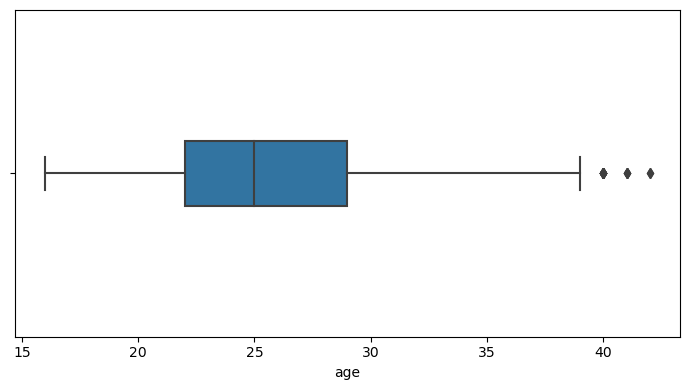

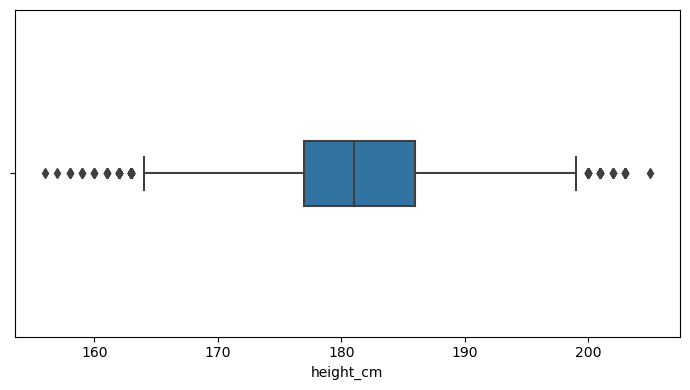

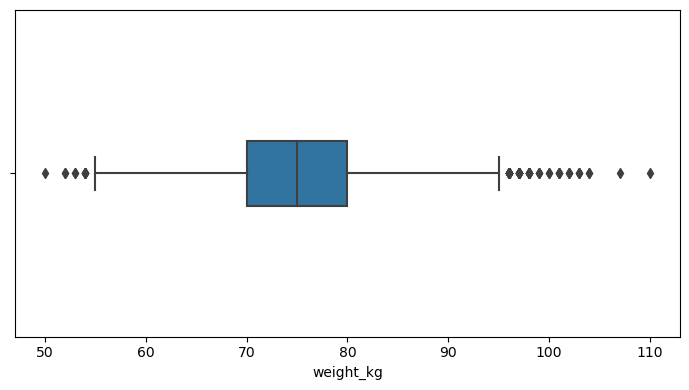

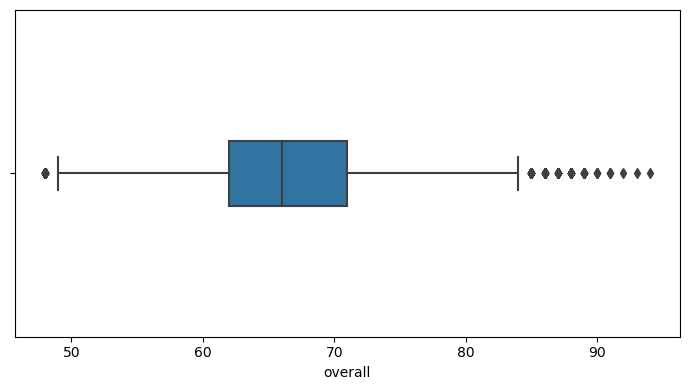

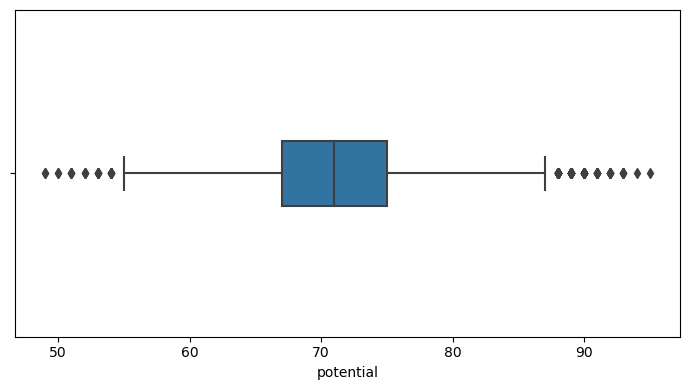

...

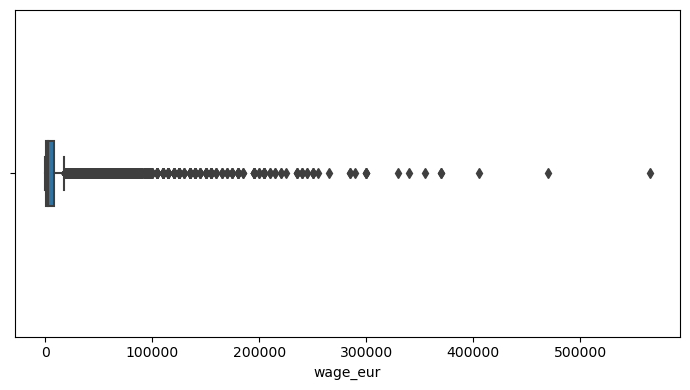

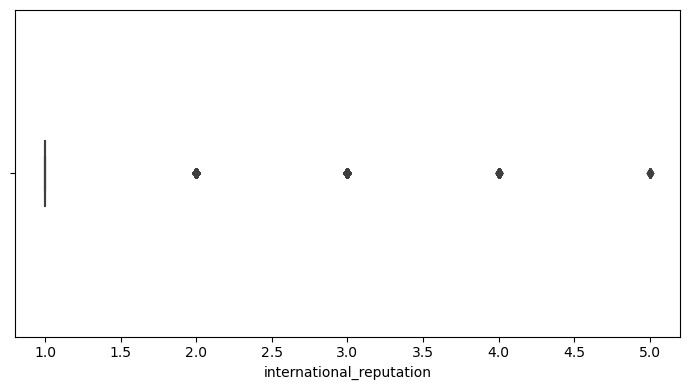

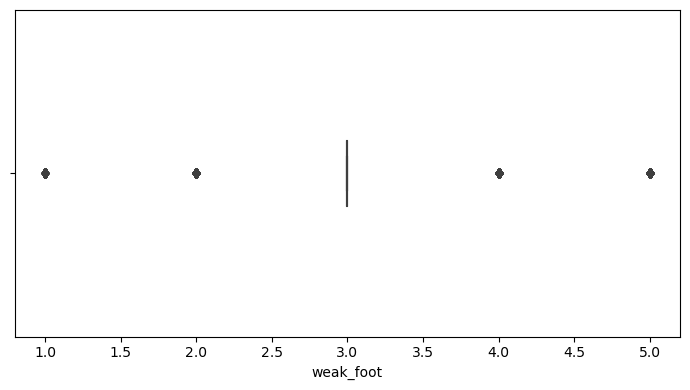

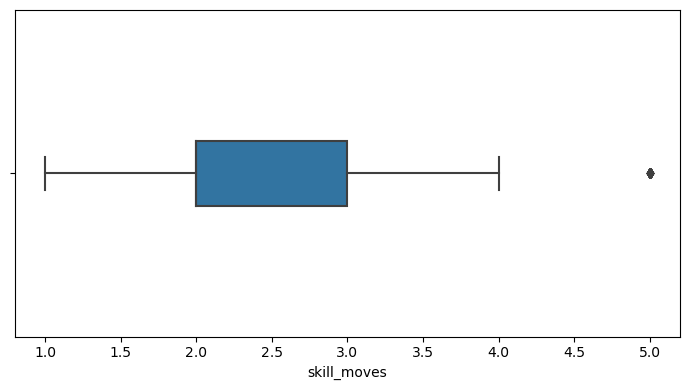

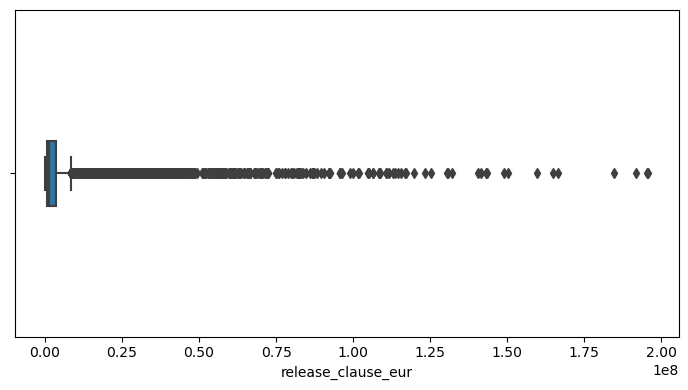

In [152]:
for col in numeric_dataset1.columns:
 plt.figure(figsize=(7,4))
 sns.boxplot(x = col, data = dataset_1 , width=0.2)
 plt.tight_layout()
 plt.show()

###### We observe:
###### features like age, weight_kg etc have few outliers features like wage_eur and value_eur have a lot of outliers as can be seen from their boxplots. Since
###### we are only analysing and visualising data in this notebook, we don't need to handle outliers at present.


### Exploring Features

###### Top 10 club and countries in FIFA_20

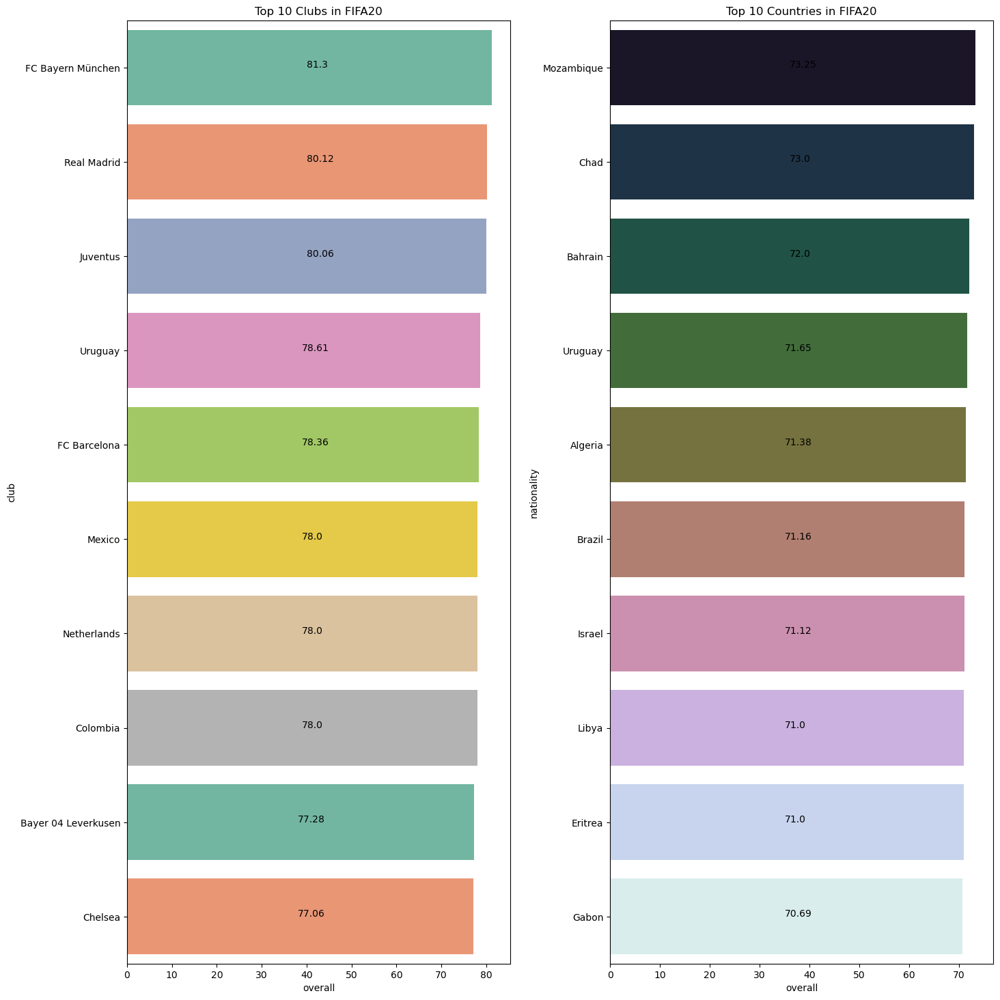

In [153]:
plt.subplot(121)
top_clubs = data.groupby(['club']).overall.mean().sort_values(ascending = False)[:10]
plt.title("Top 10 Clubs in FIFA20")
sns.barplot(y = top_clubs.index, x = top_clubs, palette="Set2")
for index, value in enumerate(top_clubs):
 plt.text(value//2, index, str(round(value,2)))
 
plt.subplot(122)
top_countries = data.groupby(['nationality']).overall.mean().sort_values(ascending = False)[:10]
plt.title("Top 10 Countries in FIFA20")
sns.barplot(y = top_countries.index, x = top_countries, palette="cubehelix")
for index, value in enumerate(top_countries):
 plt.text(value//2, index, str(round(value,2)))
 
plt.tight_layout(pad=2.0)

### Top 10 players and highest potential players in FIFA_20

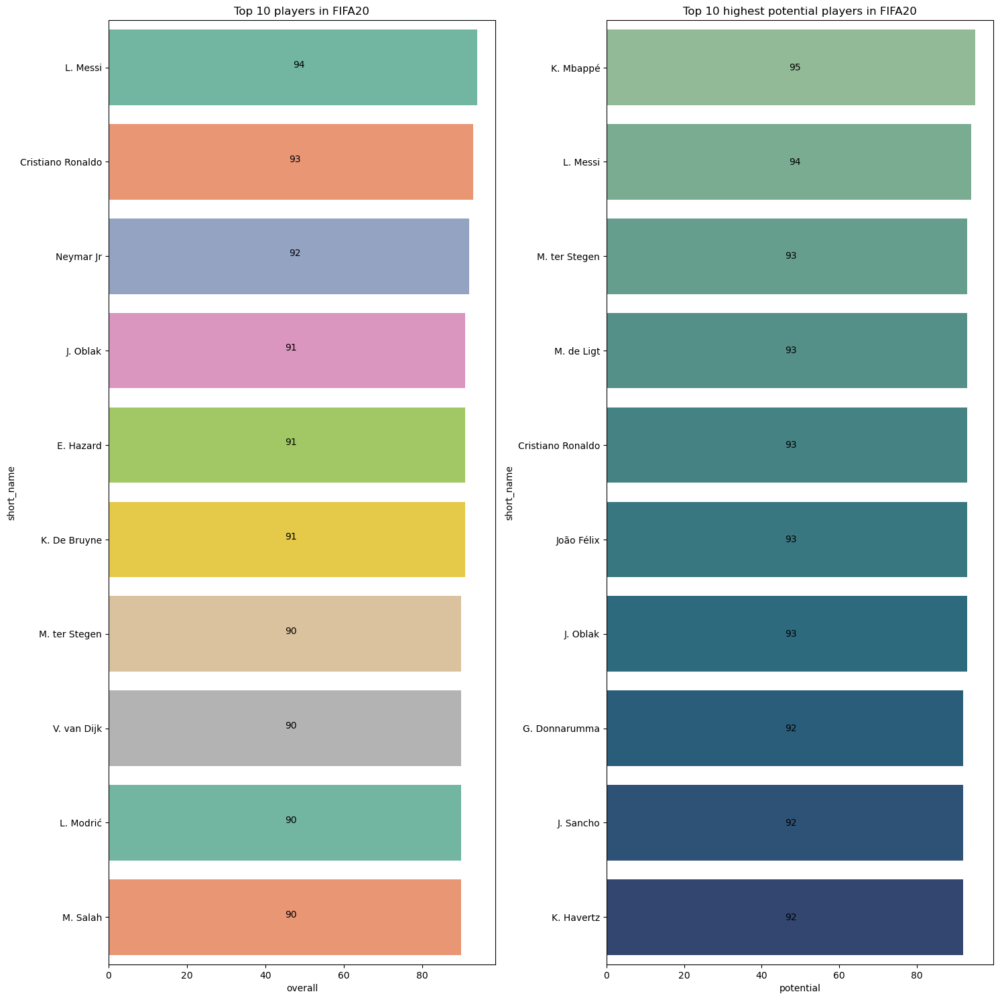

In [154]:
plt.subplot(121)
top_players = data[['short_name', 'overall']][:10]
plt.title("Top 10 players in FIFA20")
sns.barplot(y = top_players.short_name, x = top_players.overall, palette="Set2")
for index, value in enumerate(top_players.overall):
    plt.text(value//2, index, str(value))
 
plt.subplot(122)
def plot_top20(dataframe, metric):
 metric_df = data[['short_name', metric]].sort_values(by = [metric], ascending = False)[:10]
 plt.title(f"Top 10 highest {metric} players in FIFA20")
 sns.barplot(y = metric_df.short_name, x = metric_df[metric], palette="crest")
 for index, value in enumerate(metric_df[metric]):
     plt.text(value//2, index, str(round(value,2)), verticalalignment='center')
plot_top20(data, 'potential')
plt.tight_layout(pad=1.0)

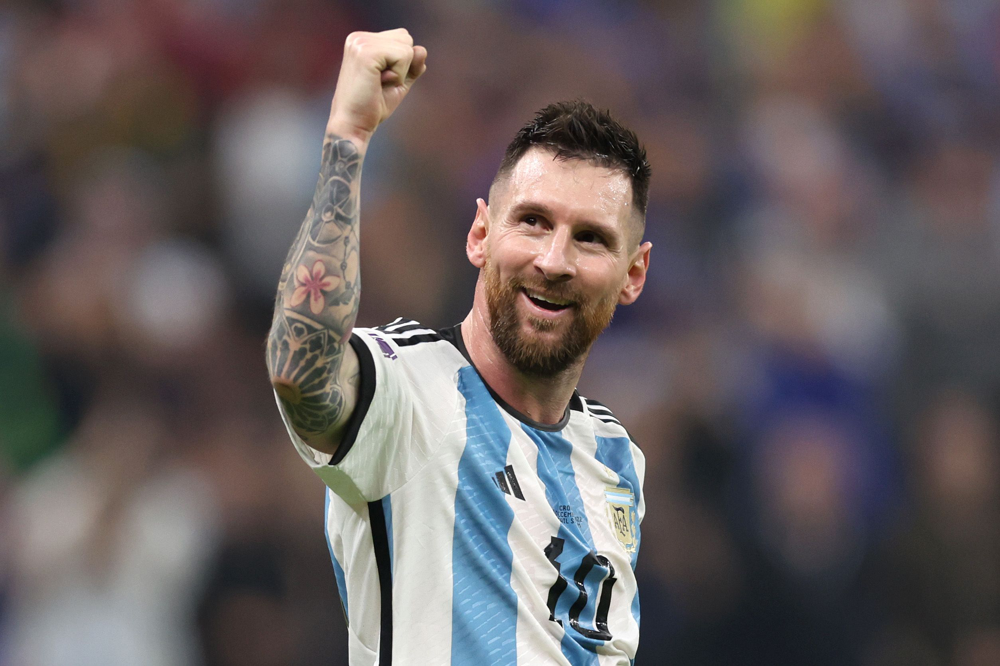

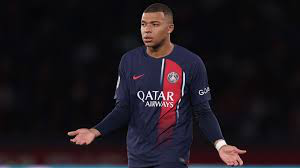

#### Now, let us pick features from dataset1 and observe trends and patterns in them.

### Age


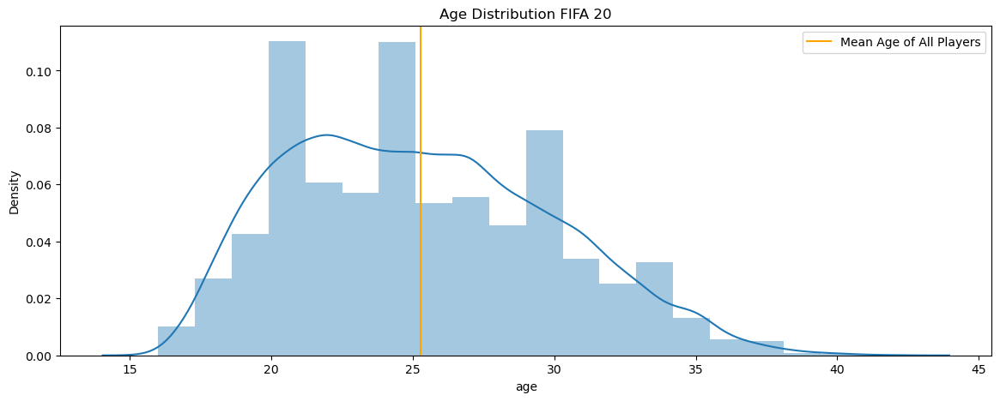

In [155]:
plt.figure(figsize=(14,5))
plt.title('Age Distribution FIFA 20')
sns.distplot(a=data['age'], kde=True, bins=20)
plt.axvline(x=np.mean(data['age']),c='orange',label='Mean Age of All Players')
plt.legend()

#### Count of players of different ages

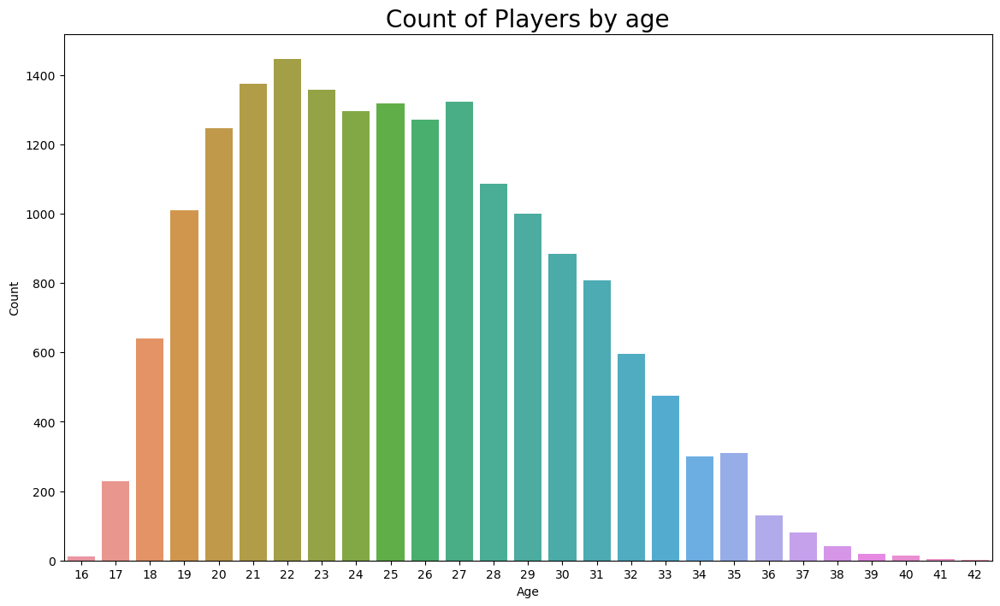

In [156]:
plt.figure(figsize= (14,8))
ax = sns.countplot(x='age', data=data)
ax.set_title(label='Count of Players by age', fontsize=20)
ax.set_xlabel(xlabel='Age')
ax.set_ylabel(ylabel='Count')
plt.show()

##### Percentage of players by age group

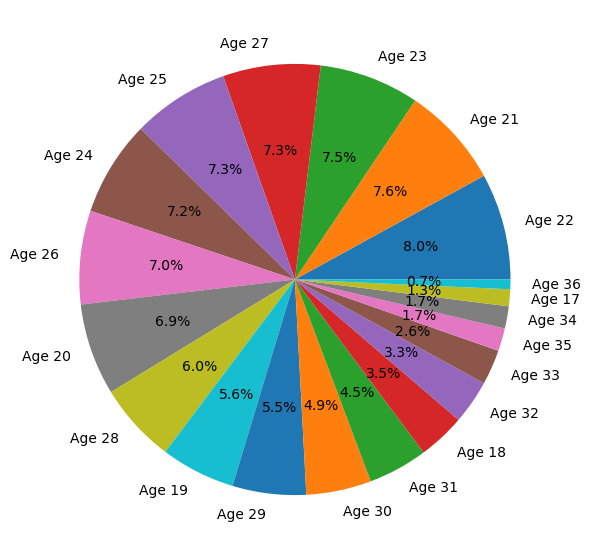

In [157]:
fifa_data_age_group = data.groupby(data["age"]).count()
fifa_data_age_group_sorted = fifa_data_age_group.sort_values(by=["short_name"], ascending=False)
fifa_data_rep_label = []
for age in fifa_data_age_group_sorted.head(20).index:
    fifa_data_rep_label.append("Age " + str(age))
 
plt.figure(figsize=(7,7))
plt.pie(fifa_data_age_group_sorted["short_name"].head(20), labels = fifa_data_rep_label, autopct="%.1f%%")
plt.show()

###### 1) We have more number of players in the age(decreasing order) given below:
 ###### 22, 21, 23, 27, 25, 24, 26, 20, 28, 19

### Oldest Player

In [158]:
print("Oldest Players: ")
data.loc[data['age'] == data['age'].max()]

Oldest Players: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
11832,142998,https://sofifa.com/player/142998/cristian-muno...,C. Muñoz,Cristian Fernando Muñoz Hoffman,42,1977-07-01,177,73,Argentina,CD Universidad de Concepción,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13003,208927,https://sofifa.com/player/208927/hussain-omar-...,H. Sulaimani,Hussein Omar Abdul Ghani Sulaimani,42,1977-01-21,173,70,Saudi Arabia,Al Ahli,...,62+2,66+2,66+2,66+2,62+2,62+2,66+2,66+2,66+2,62+2


### Youngest Player

In [159]:
print("Youngest Players: ")
data.loc[data['age'] == data['age'].min()]

Youngest Players: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
4764,246618,https://sofifa.com/player/246618/adam-hlozek/2...,A. Hložek,Adam Hložek,16,2002-07-25,185,80,Czech Republic,Sparta Praha,...,52+2,50+2,50+2,50+2,52+2,49+2,46+2,46+2,46+2,49+2
6630,252037,https://sofifa.com/player/252037/fabio-daniel-...,Fábio Silva,Fábio Daniel Soares Silva,16,2002-07-19,185,75,Portugal,FC Porto,...,43+2,40+2,40+2,40+2,43+2,41+2,38+2,38+2,38+2,41+2
12158,252259,https://sofifa.com/player/252259/enzo-millot/2...,E. Millot,Enzo Millot,16,2002-07-17,175,65,France,AS Monaco,...,58+2,56+2,56+2,56+2,58+2,56+2,51+2,51+2,51+2,56+2
12160,247888,https://sofifa.com/player/247888/sebastiano-es...,S. Esposito,Sebastiano Esposito,16,2002-07-02,186,75,Italy,Inter,...,41+2,40+2,40+2,40+2,41+2,39+2,37+2,37+2,37+2,39+2
14626,252238,https://sofifa.com/player/252238/alan-velasco/...,A. Velasco,Alan Velasco,16,2002-07-27,167,63,Argentina,Independiente,...,55+2,54+2,54+2,54+2,55+2,55+2,50+2,50+2,50+2,55+2
17614,248187,https://sofifa.com/player/248187/daniel-obbekj...,D. Obbekjær,Daniel Obbekjær,16,2002-07-16,193,86,Denmark,Odense Boldklub,...,44+2,48+2,48+2,48+2,44+2,46+2,51+2,51+2,51+2,46+2
17782,248567,https://sofifa.com/player/248567/sebastian-and...,S. Anderson,Sebastian Anderson,16,2002-08-08,175,64,United States,Colorado Rapids,...,50+2,48+2,48+2,48+2,50+2,50+2,48+2,48+2,48+2,50+2
17827,251219,https://sofifa.com/player/251219/darragh-burns...,D. Burns,Darragh Burns,16,2002-08-06,176,62,Northern Ireland,St. Patrick's Athletic,...,43+2,39+2,39+2,39+2,43+2,42+2,36+2,36+2,36+2,42+2
18031,246815,https://sofifa.com/player/246815/oliver-stefan...,O. Stefánsson,Oliver Stefánsson,16,2002-08-03,190,75,Iceland,IFK Norrköping,...,43+2,45+2,45+2,45+2,43+2,46+2,50+2,50+2,50+2,46+2
18171,252892,https://sofifa.com/player/252892/joseph-starbu...,J. Starbuck,Joseph Starbuck,16,2002-08-03,174,69,England,Grimsby Town,...,44+2,43+2,43+2,43+2,44+2,43+2,40+2,40+2,40+2,43+2


###### Youngest Player in fifa_20 :- A. Hložek

### Skewness

In [160]:
data['age'].skew()

0.38061976075931975

#### Impact of Age on Overall rating

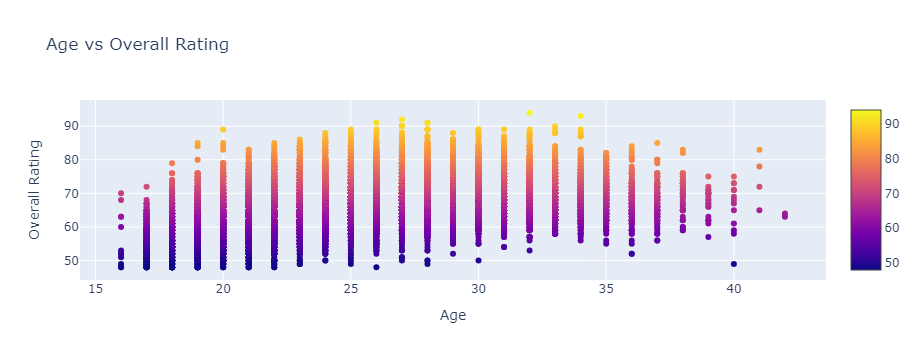

In [161]:
fig = go.Figure()
fig = go.Figure(data=go.Scatter(
 x = data['age'],
 y = data['overall'],
 mode='markers',
 marker=dict(
 color=data['overall'],
 showscale=True
 ),
 text= data['short_name'],
))
fig.update_layout(title='Age vs Overall Rating',
 xaxis_title='Age',
 yaxis_title='Overall Rating')
fig.show()

We infer:
1. No definite pattern is visible since the plot is vastly spread.
2. While age doesnt linearly effect rating, some trends can be observed.
3. Minimum rating generally increases with age.
4. Maximum of rating first increases and then decreases, with peak at 32 (Messi)

### Height

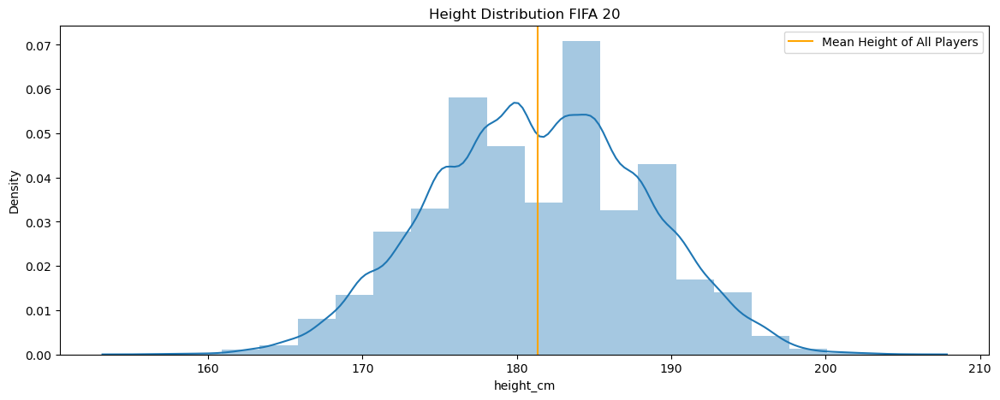

In [162]:
plt.figure(figsize=(14,5))
plt.title('Height Distribution FIFA 20')
sns.distplot(a=data['height_cm'], kde=True, bins=20)
plt.axvline(x=np.mean(data['height_cm']),c='orange',label='Mean Height of All Players')
plt.legend()


### Tallest Player

In [163]:
print("Tallest Players: ")
data.loc[data['height_cm'] == data['height_cm'].max()]

Tallest Players: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
9208,199321,https://sofifa.com/player/199321/tomas-holy/20...,T. Holý,Tomáš Holý,27,1991-12-10,205,102,Czech Republic,Ipswich Town,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Shortest Player

In [164]:
print("Shortest Player: ")
data.loc[data['height_cm'] == data['height_cm'].min()]


Shortest Player: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
4829,237994,https://sofifa.com/player/237994/nahuel-barrio...,N. Barrios,Cristian Nahuel Barrios,21,1998-05-07,156,58,Argentina,San Lorenzo de Almagro,...,56+2,52+2,52+2,52+2,56+2,54+2,44+2,44+2,44+2,54+2


###### Shortest Player in fifa_20 :- N. Barrios

### Skewness

In [165]:
data['height_cm'].skew()

-0.03819688576323108

### Height v Pace

<Figure size 1500x1500 with 0 Axes>

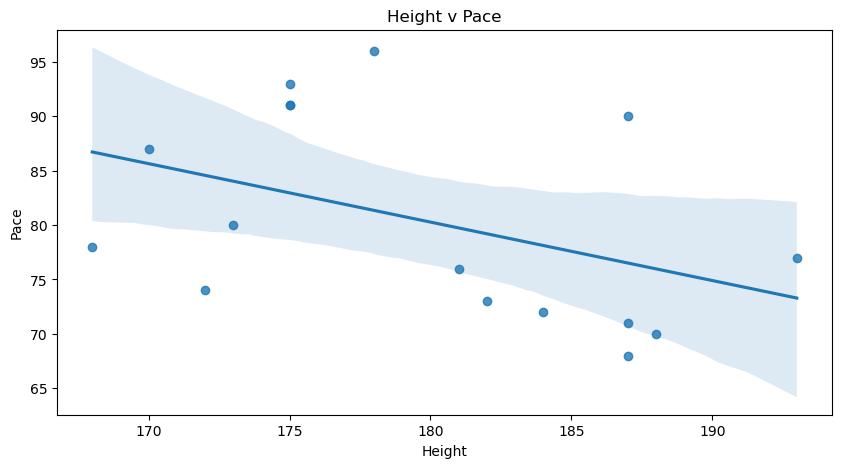

In [166]:
plt.figure()
plt.figure(figsize=(10,5))
x=data.head(20)['height_cm']
y=data.head(20)['pace']
sns.regplot(x=x,y=y)
plt.title('Height v Pace')
plt.xlabel('Height')
plt.ylabel('Pace')
plt.show()

###### We observe:
###### 1.Pace tends to decrease with increase in height.

### Weight

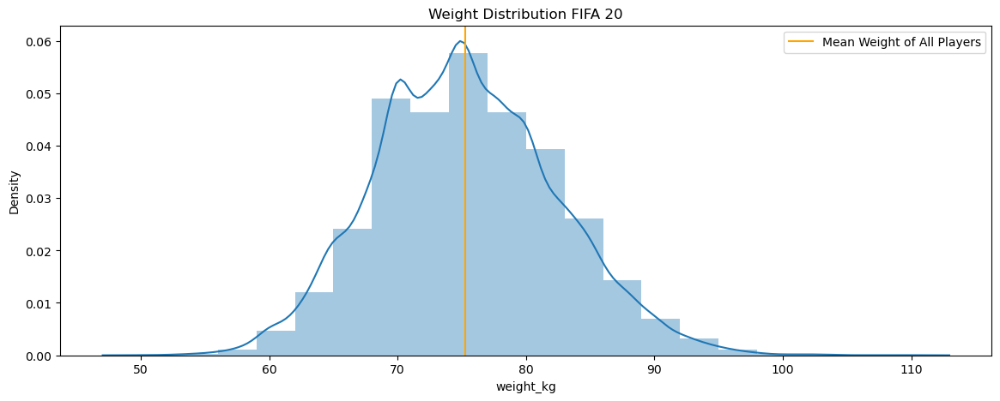

In [167]:
plt.figure(figsize=(14,5))
plt.title('Weight Distribution FIFA 20')
sns.distplot(a=data['weight_kg'], kde=True, bins=20)
plt.axvline(x=np.mean(data['weight_kg']),c='orange',label='Mean Weight of All Players')
plt.legend()


In [168]:
print("Lightest Player: ")
data.loc[data['weight_kg'] == data['weight_kg'].min()]

Lightest Player: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
13070,235600,https://sofifa.com/player/235600/bandar-al-mut...,B. Al Mutairi,Bandar Al Mutairi,29,1990-03-14,168,50,Saudi Arabia,Al Fayha,...,62+2,56+2,56+2,56+2,62+2,61+2,56+2,56+2,56+2,61+2


In [169]:
print("heaviest Player: ")
data.loc[data['weight_kg'] == data['weight_kg'].max()]

heaviest Player: 


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
10693,156321,https://sofifa.com/player/156321/adebayo-akinf...,A. Akinfenwa,Adebayo Akinfenwa,37,1982-05-10,178,110,England,Wycombe Wanderers,...,44+2,49+2,49+2,49+2,44+2,43+2,48+2,48+2,48+2,43+2


### Weight v Pace

<Figure size 1500x1500 with 0 Axes>

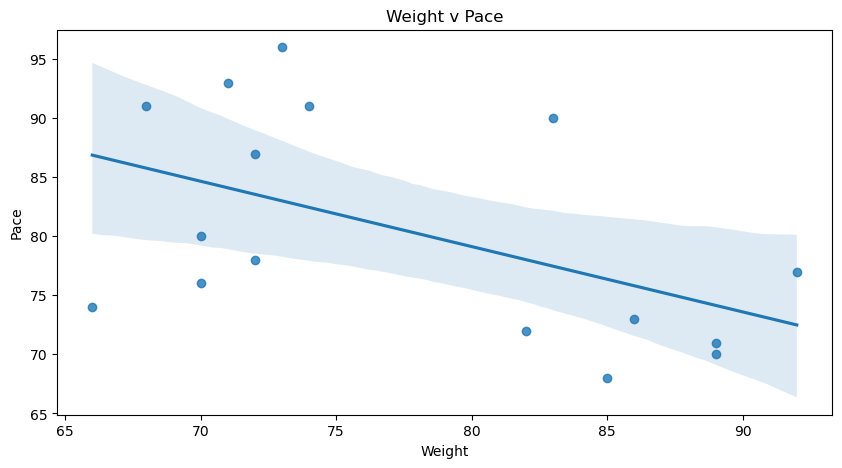

In [170]:
plt.figure()
plt.figure(figsize=(10,5))
x=data.head(20)['weight_kg']
y=data.head(20)['pace']
sns.regplot(x=x,y=y)
plt.title('Weight v Pace')
plt.xlabel('Weight')
plt.ylabel('Pace')
plt.show()


We observe:
1. Pace tends to decrease with increase in weight.

#### Height v Weight

<Figure size 1500x1500 with 0 Axes>

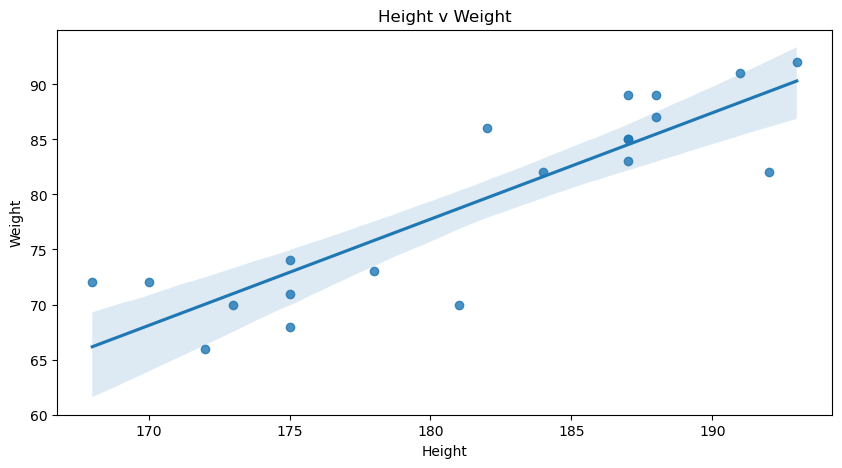

In [171]:
plt.figure()
plt.figure(figsize=(10,5))
x=data.head(20)['height_cm']
y=data.head(20)['weight_kg']
sns.regplot(x=x,y=y)
plt.title('Height v Weight')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.show()

We observe:
1. Height and weight are linearly dependant

### BMI

##### Let us now create a new feature BMI from weight and height, and analyse its effect on performance ratings.


In [172]:
data['bmi'] = data['weight_kg'] // (data['height_cm']/100)**2


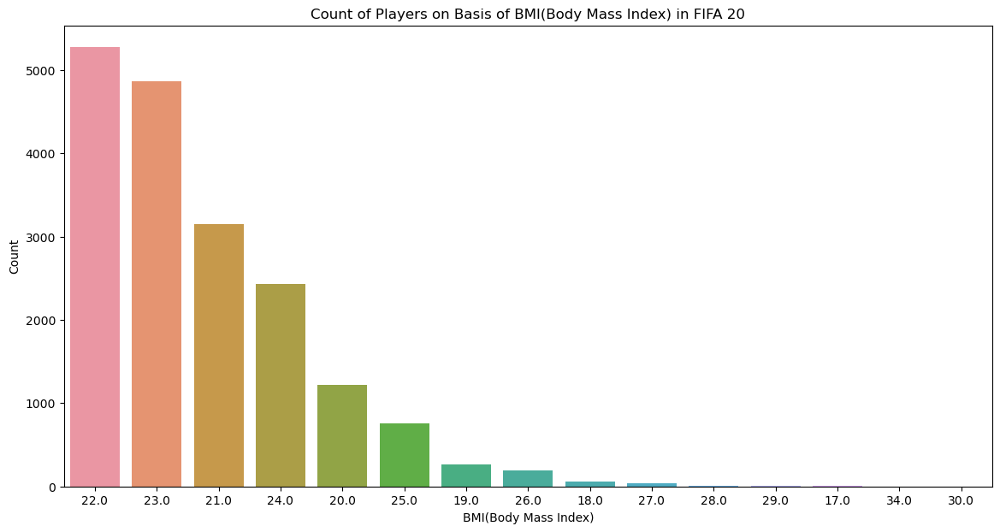

In [173]:
plt.figure(figsize= (14, 7))
ax = sns.countplot(x='bmi', data=data, order=data.bmi.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of BMI(Body Mass Index) in FIFA 20')
ax.set_xlabel(xlabel='BMI(Body Mass Index)')
ax.set_ylabel(ylabel='Count')
plt.show()

###### 22 is the most common BMI

##### BMI vs Overall Rating

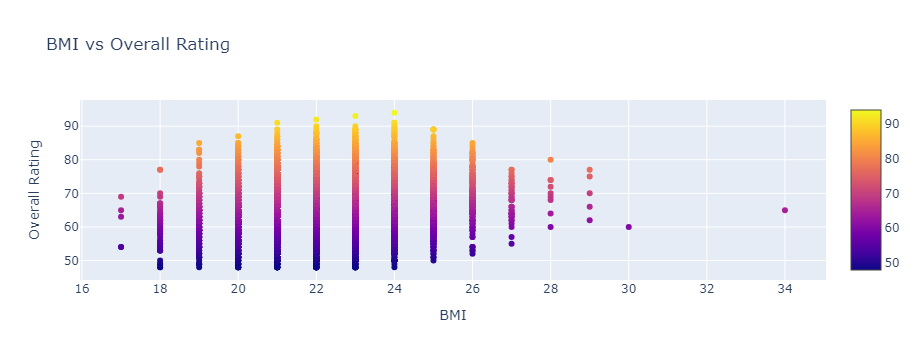

In [174]:
fig = go.Figure()
fig = go.Figure(data=go.Scatter(
 x = data['bmi'],
 y = data['overall'],
 mode='markers',
marker=dict(
 color=data['overall'],
 showscale=True
 ),
 text= data['short_name'],
))
fig.update_layout(title='BMI vs Overall Rating',
 xaxis_title='BMI',
 yaxis_title='Overall Rating')
fig.show()

We observe:
1. Highest rating for BMI 24
2. No direct relation
3. Maximum of rating first increases and then decreases

### Nationality

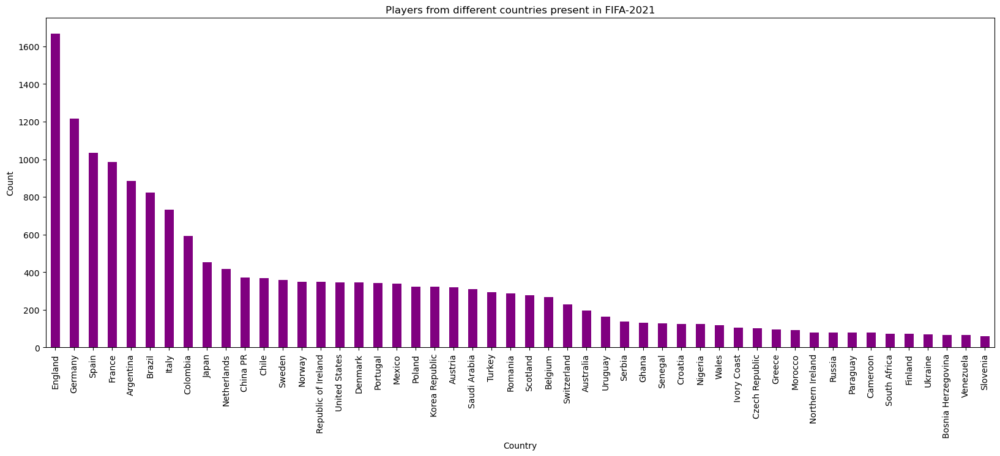

In [175]:
plt.figure(figsize = (20,7))
data['nationality'].value_counts().head(50).plot.bar(color = 'purple')
plt.title('Players from different countries present in FIFA-2021')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

We observe:
1. England, Germany and Spain has the highest number of players.
2. Venezuela and Slovenia have least number of players


#### Nationality vs Overall Rating

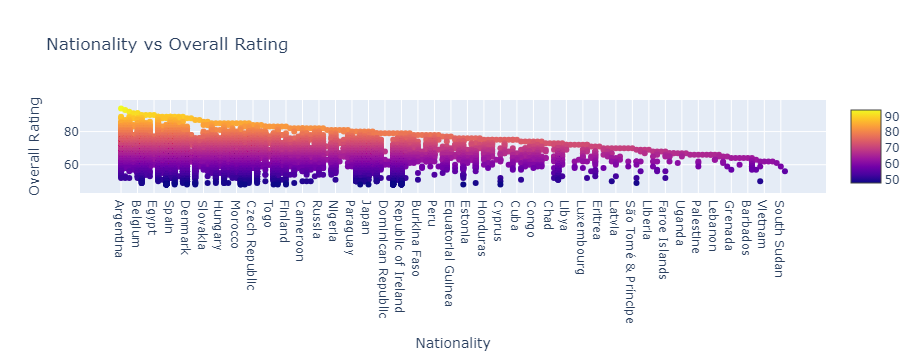

In [176]:
fig = go.Figure()
fig = go.Figure(data=go.Scatter(
 x = data['nationality'],
 y = data['overall'],
 mode='markers',
 marker=dict(
 color=data['overall'],
 showscale=True
 ),
 text= data['short_name'],
))
fig.update_layout(title='Nationality vs Overall Rating',
 xaxis_title='Nationality',
 yaxis_title='Overall Rating')
fig.show()

We observe:
1. Argetina Players have the highest maximum rating.
2. South Sudan has least maximum rating.

### Overall

plt.figure(figsize=(14, 7))
sns.countplot(data=data,x='overall')
plt.title("Overall Rating")
plt.show()


We observe:
1. Most players have rating in range 60-70.
2. Very few players have rating > 80


##### Now let us find mean, min and max values of our data

In [177]:
print("Min: ", data['overall'].min())
print("Mean: ", data['overall'].mean())
print("Max: ", data['overall'].max())

Min:  48
Mean:  66.24499398183609
Max:  94


#### Player with highest rating

In [178]:
data.loc[data['overall'] == data['overall'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0


###### L.Messi has highest overall rating which is 94

### Top Rated Players

##### Now let us find top rated players and analyse their origins

### Top 10 Players

In [179]:
top_rated = data.sort_values(by=["overall"], ascending=False)
top_rated.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23.0
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
6,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24.0
8,177003,https://sofifa.com/player/177003/luka-modric/2...,L. Modrić,Luka Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,...,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3,22.0
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23.0


#### Percentage of Clubs in top 25 players

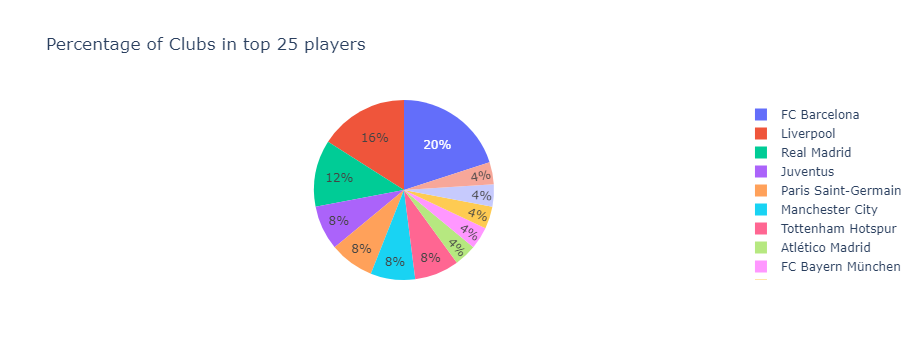

In [180]:
fig = px.pie(top_rated.head(25), names='club',
 title='Percentage of Clubs in top 25 players')
fig.show()

#### Percentage of Nations in top 25 players

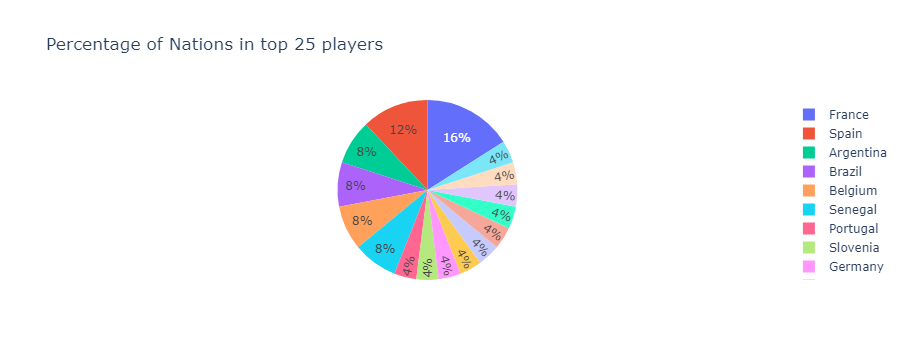

In [181]:
fig = px.pie(top_rated.head(25), names='nationality',
 title='Percentage of Nations in top 25 players')
fig.show()

### Potential


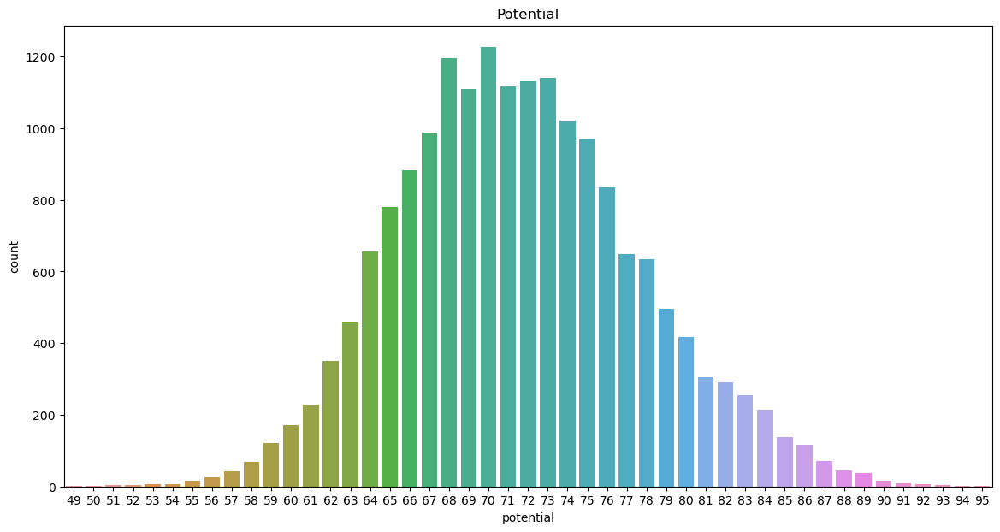

In [182]:
plt.figure(figsize=(14, 7))
sns.countplot(data=data,x='potential')
plt.title("Potential")
plt.show()

#### potential v Overall

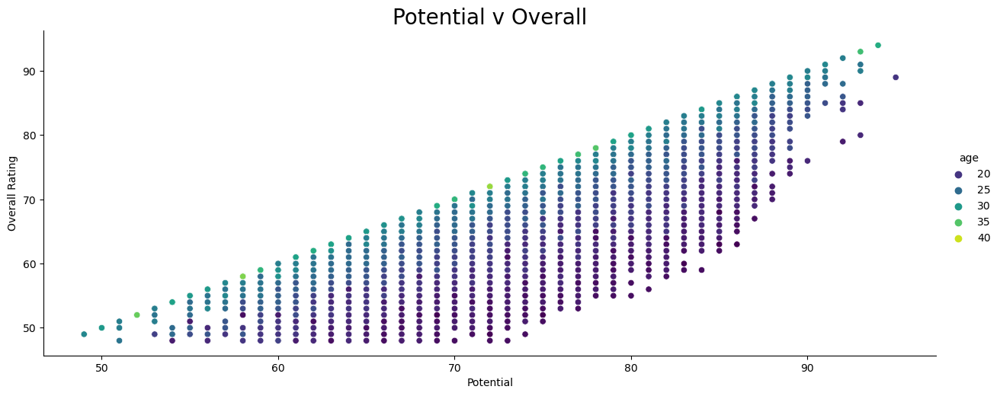

In [183]:
sns.relplot(x='potential',y='overall',hue='age',palette = 'viridis', aspect=2.5,data=data)
plt.title('Potential v Overall',fontsize = 20)
plt.xlabel('Potential')
plt.ylabel('Overall Rating')
plt.show()

We notice:
1. Overall Rating is linearly dependant on your Potential

### Value

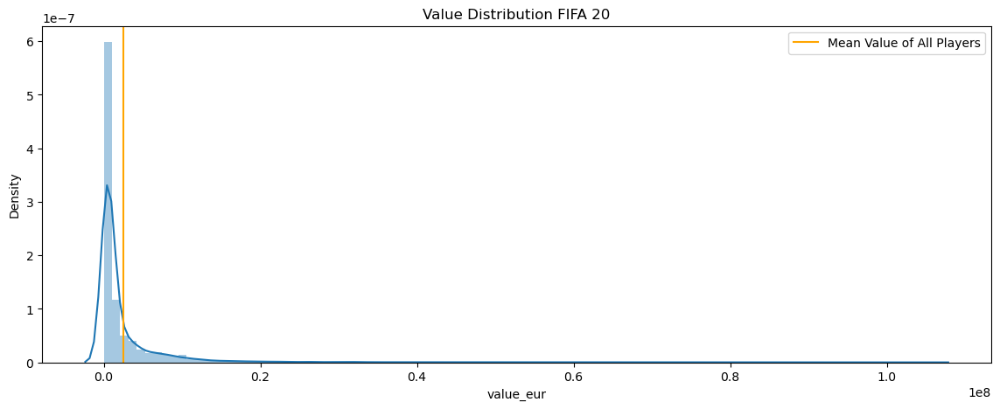

In [184]:
plt.figure(figsize=(14,5))
plt.title('Value Distribution FIFA 20')
sns.distplot(a=data['value_eur'], kde=True, bins=100)
plt.axvline(x=np.mean(data['value_eur']),c='orange',label='Mean Value of All Players')
plt.legend()

We observe:
1. The distribution is highly skewed.

### Skewness

In [185]:
data['value_eur'].skew()

6.425940918096741

##### Value of Top 10 players

Text(0.5, 1.0, 'Value of top 10 players')

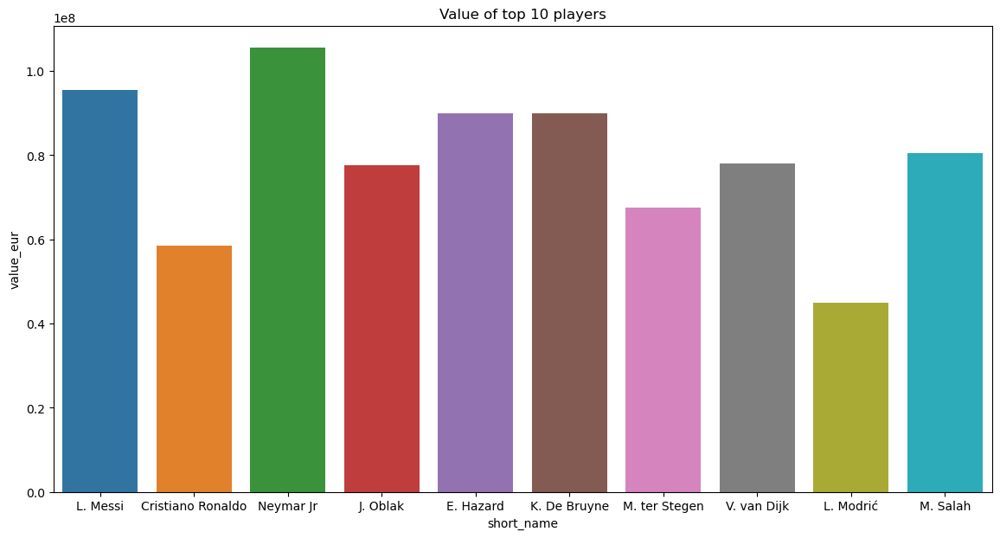

In [186]:
plt.figure(figsize=(14, 7))
sns.barplot(x=top_rated['short_name'].head(10), y=top_rated['value_eur'].head(10)).set_title("Value of top 10 players")

#### Most Valueable

In [187]:
data.loc[data['value_eur'] == data['value_eur'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0


##### Most Valueable player is Neymar Jr from Brazil

##### 10 Most Valued Players

In [188]:
top_valued = data.sort_values(by=["value_eur"], ascending=False)
top_valued.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,...,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
12,202126,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,...,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25.0
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23.0
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24.0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0
23,211110,https://sofifa.com/player/211110/paulo-dybala/...,P. Dybala,Paulo Bruno Exequiel Dybala,25,1993-11-15,177,75,Argentina,Juventus,...,64+3,64+3,64+3,68+3,64+3,54+3,54+3,54+3,64+3,23.0


Text(0.5, 1.0, 'Top 10 Valued players')

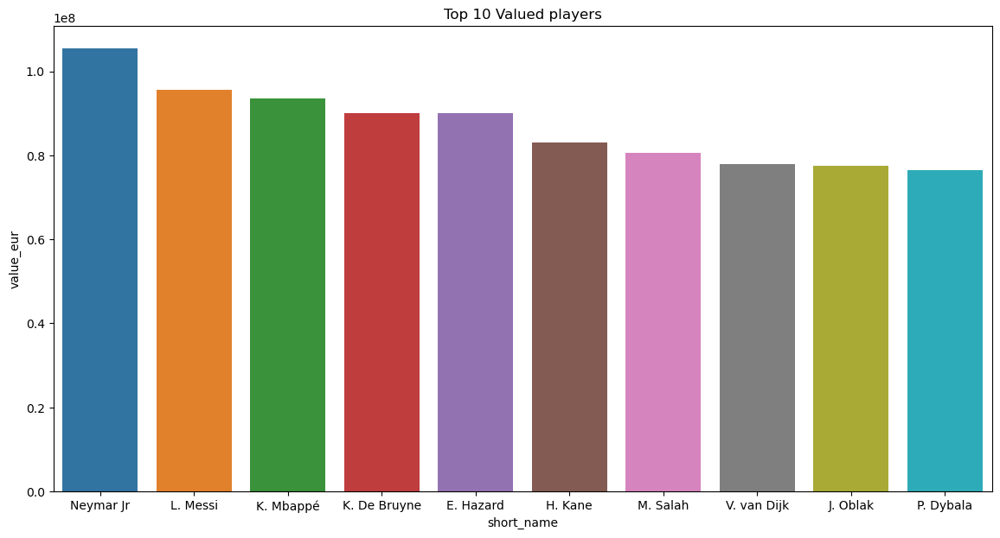

In [189]:
plt.figure(figsize=(14, 7))
sns.barplot(x=top_valued['short_name'].head(10),y= top_valued['value_eur'].head(10)).set_title("Top 10 Valued players")


### Preferred Foot

<Axes: xlabel='preferred_foot', ylabel='count'>

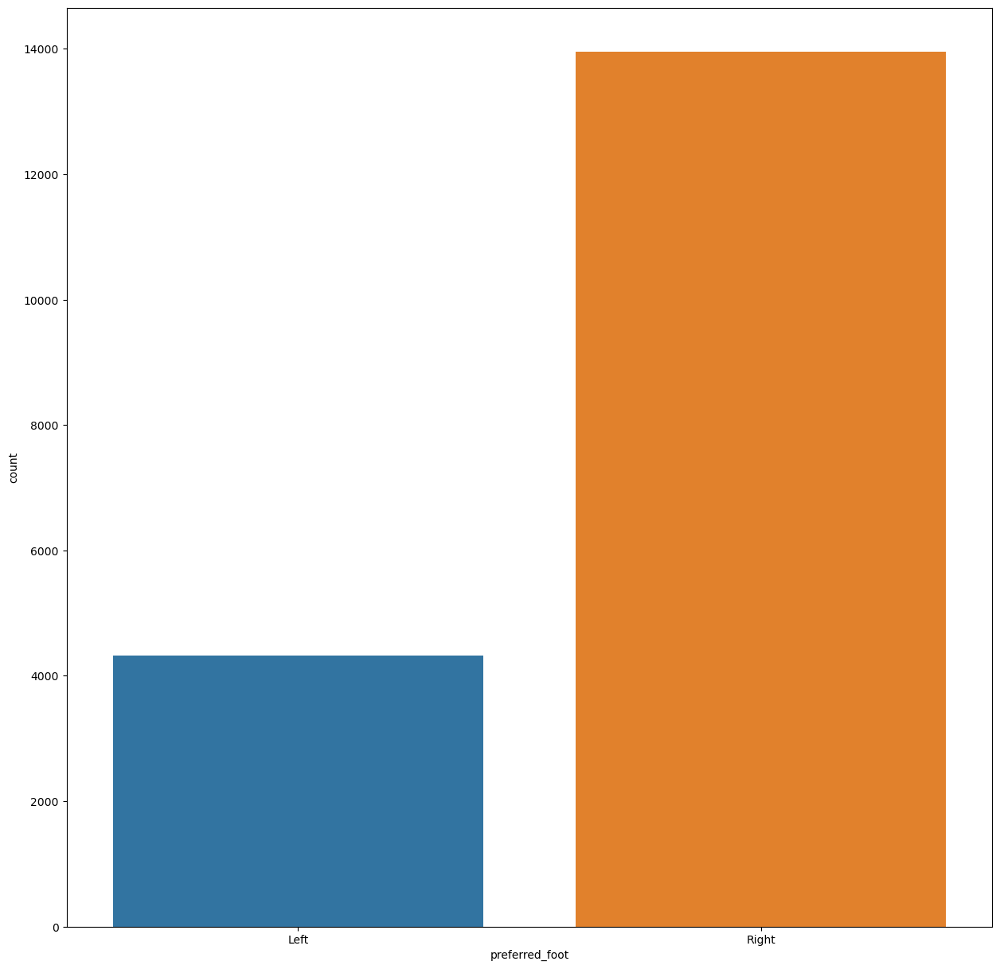

In [190]:
 sns.countplot(x = data['preferred_foot'])

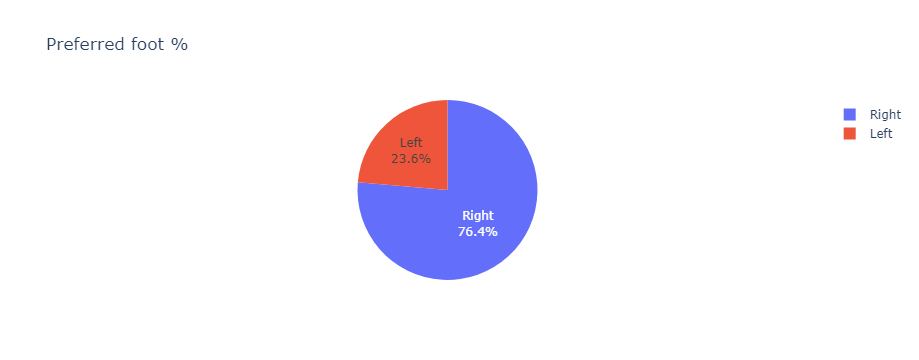

In [191]:
foot = ['Left', 'Right']
foot_data = data.query('preferred_foot in @foot') 
fig = px.pie(foot_data, names='preferred_foot',
 title='Preferred foot %')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [192]:

print("The average overall score of preferred Right foot", data.loc[data['preferred_foot'] == 'Right']['overall'].mean())
print("The average overall score of preferred Left foot", data.loc[data['preferred_foot'] == 'Left']['overall'].mean())

The average overall score of preferred Right foot 66.11174785100286
The average overall score of preferred Left foot 66.67577582213988


We observe:
1. Preferred foot doesn't have a significant impact on the overall score.

### International Reputation


<Axes: xlabel='international_reputation', ylabel='count'>

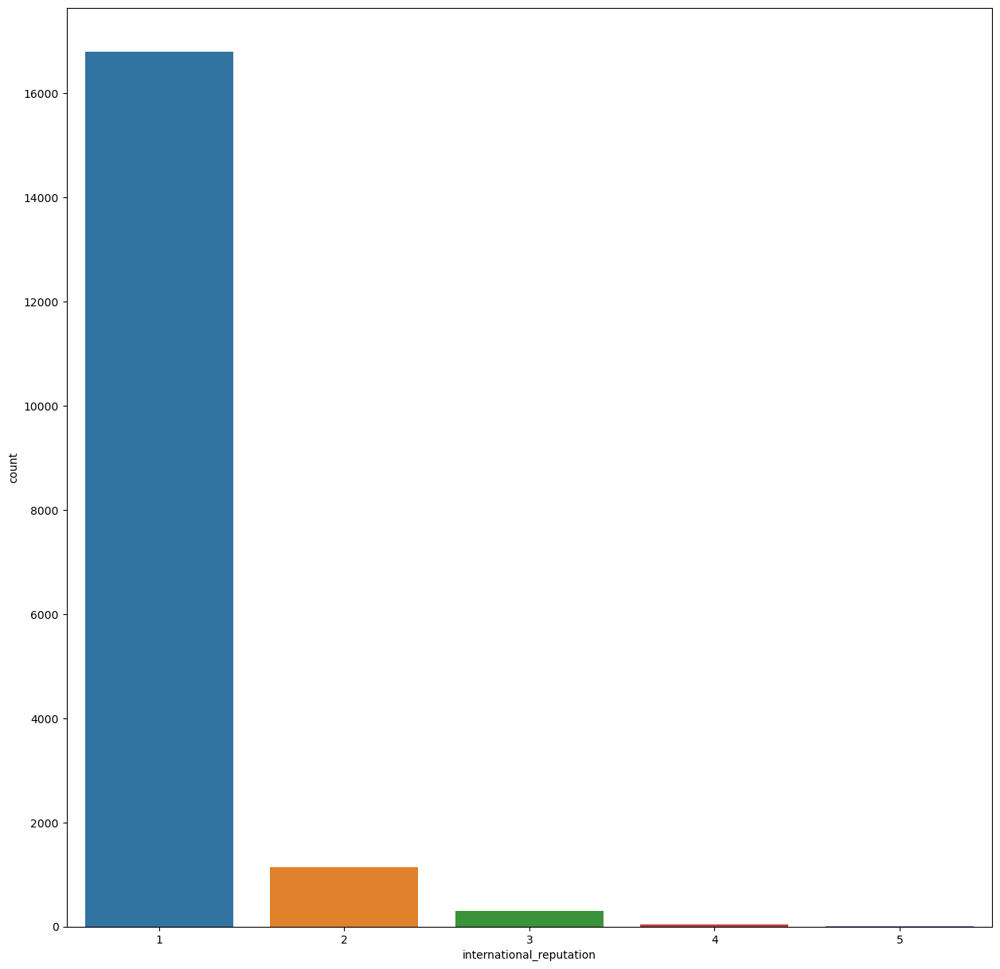

In [193]:
sns.countplot(x = data['international_reputation'])


### Skill Moves

<Axes: xlabel='skill_moves', ylabel='count'>

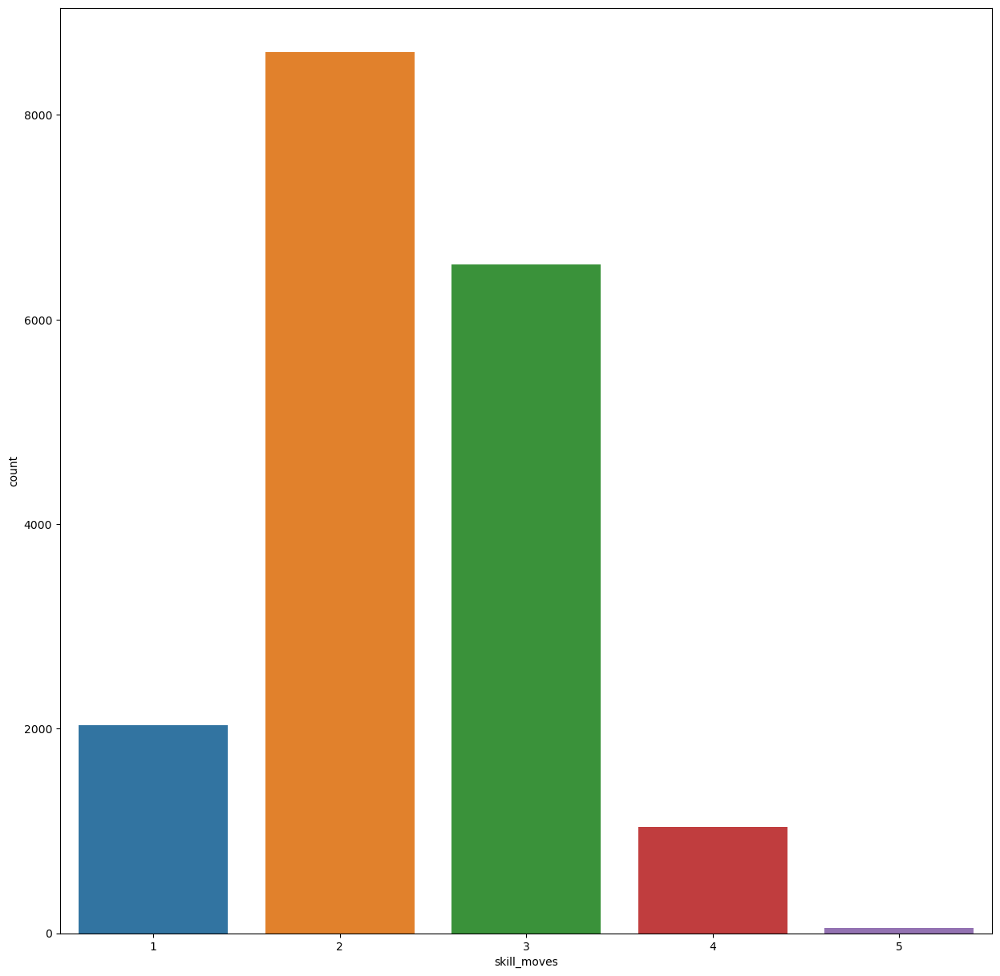

In [194]:
sns.countplot(x = data['skill_moves'])


### Work Rate

<Axes: xlabel='work_rate', ylabel='count'>

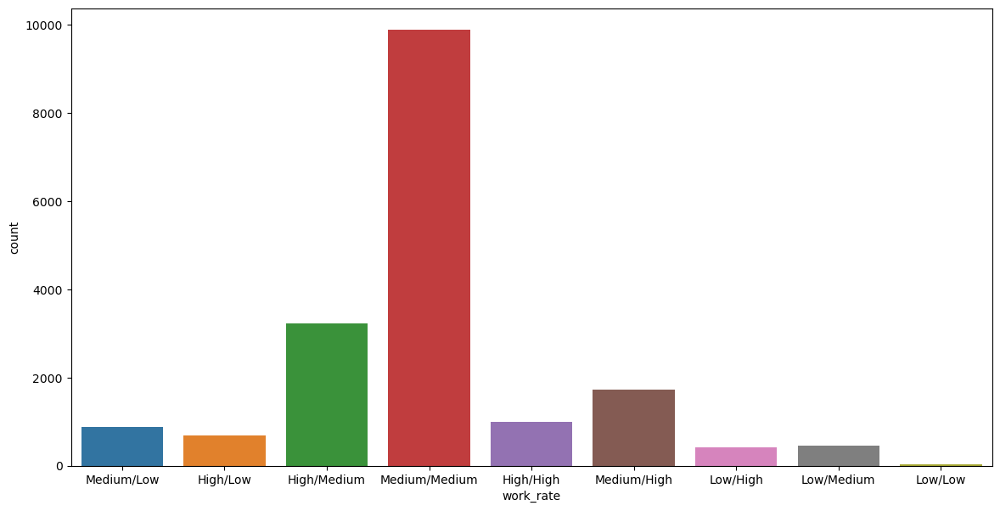

In [195]:
plt.figure(figsize=(14,7))
sns.countplot(x = data['work_rate'])

### Team Position

<Axes: xlabel='team_position', ylabel='count'>

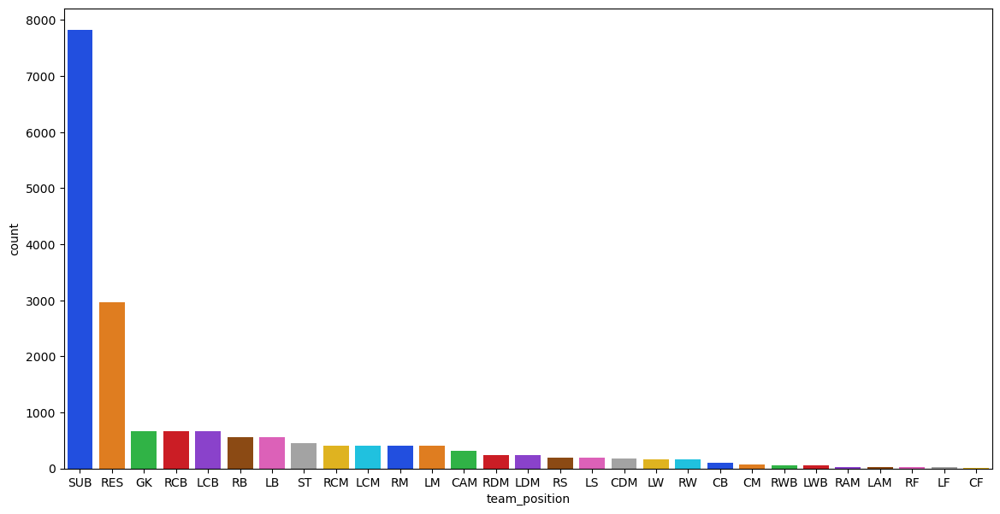

In [196]:
plt.figure(figsize=(14, 7))
sns.countplot(x='team_position', data=data, palette='bright', order=data.team_position.value_counts().index)

Team positions can be grouped into three catagories: Attack, Defend and Midfield. Let us explore them now.

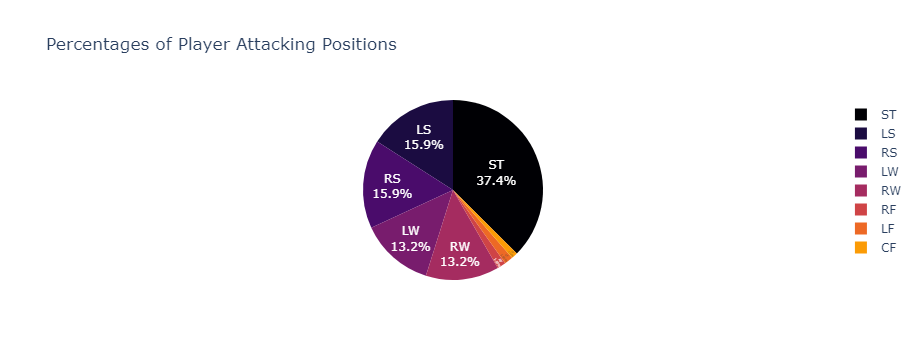

In [197]:
attack = ['LW', 'RW', 'ST', 'LF', 'RF', 'CF', 'LS', 'RS']
attack_data = data.query('team_position in @attack') 
fig = px.pie(attack_data, names='team_position',
 color_discrete_sequence=px.colors.sequential.Inferno ,
 title='Percentages of Player Attacking Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

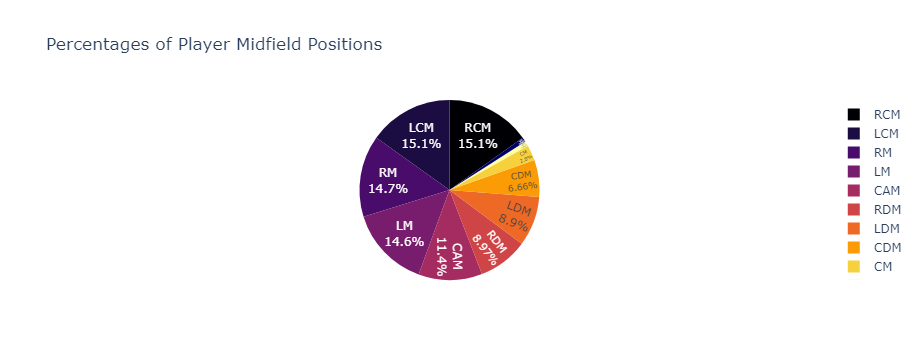

In [198]:
mid = ['CM', 'RCM', 'LCM', 'RM', 'LM', 'CAM', 'RDM', 'LDM', 'CDM', 'RAM', 'LAM']
mid_data = data.query('team_position in @mid') 
fig = px.pie(mid_data, names='team_position',
 color_discrete_sequence=px.colors.sequential.Inferno ,
 title='Percentages of Player Midfield Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

### Release Clause

In [199]:
high_release = data.sort_values(by=['release_clause_eur'], ascending=False)
high_release.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.0
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,...,62+3,62+3,62+3,66+3,63+3,54+3,54+3,54+3,63+3,23.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0
12,202126,https://sofifa.com/player/202126/harry-kane/20...,H. Kane,Harry Kane,25,1993-07-28,188,89,England,Tottenham Hotspur,...,66+3,66+3,66+3,65+3,62+3,60+3,60+3,60+3,62+3,25.0
7,203376,https://sofifa.com/player/203376/virgil-van-di...,V. van Dijk,Virgil van Dijk,27,1991-07-08,193,92,Netherlands,Liverpool,...,83+3,83+3,83+3,79+3,81+3,87+3,87+3,87+3,81+3,24.0
9,209331,https://sofifa.com/player/209331/mohamed-salah...,M. Salah,Mohamed Salah Ghaly,27,1992-06-15,175,71,Egypt,Liverpool,...,67+3,67+3,67+3,70+3,66+3,57+3,57+3,57+3,66+3,23.0
6,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,27,1992-04-30,187,85,Germany,FC Barcelona,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0


### Top Release clauses

Text(0.5, 1.0, 'Top Release clauses')

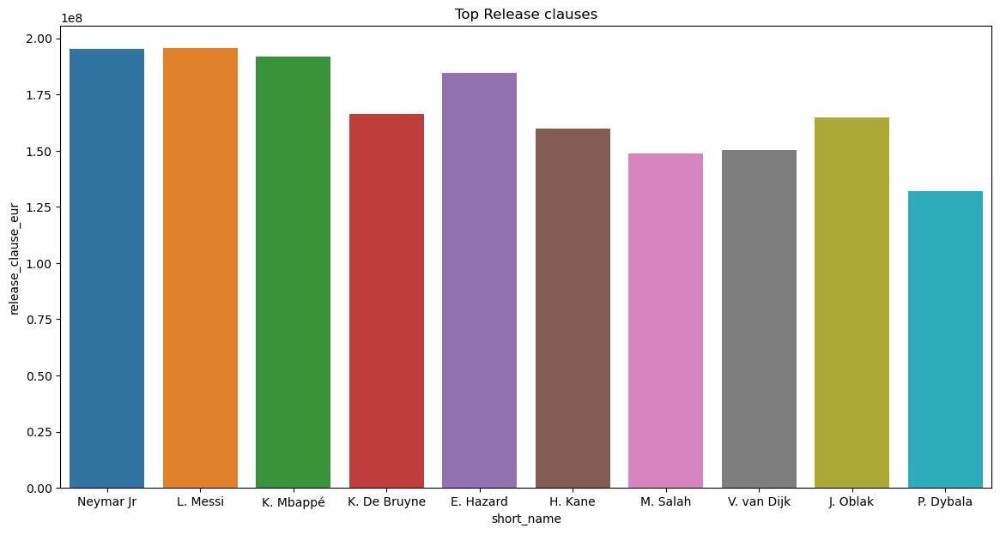

In [200]:

plt.figure(figsize=(14, 7))
sns.barplot(x=top_valued['short_name'].head(10),y= top_valued['release_clause_eur'].head(10)).set_title("Top Release clauses")

In [201]:
print("Min: ", data['release_clause_eur'].min())
print("Mean: ", data['release_clause_eur'].mean())
print("Max: ", data['release_clause_eur'].max())

Min:  13000.0
Mean:  4740717.432273263
Max:  195800000.0


### Wages

#### Highest Wages

In [202]:
high_wage = data.sort_values(by=['wage_eur'], ascending=False)
high_wage.head(10)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.0
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.0
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23.0
5,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,...,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,21.0
22,194765,https://sofifa.com/player/194765/antoine-griez...,A. Griezmann,Antoine Griezmann,28,1991-03-21,176,73,France,FC Barcelona,...,71+3,71+3,71+3,73+3,70+3,65+3,65+3,65+3,70+3,23.0
19,176580,https://sofifa.com/player/176580/luis-suarez/2...,L. Suárez,Luis Alberto Suárez Díaz,32,1987-01-24,182,86,Uruguay,FC Barcelona,...,67+5,67+5,67+5,67+5,64+5,63+5,63+5,63+5,64+5,25.0
8,177003,https://sofifa.com/player/177003/luka-modric/2...,L. Modrić,Luka Modrić,33,1985-09-09,172,66,Croatia,Real Madrid,...,81+3,81+3,81+3,81+3,79+3,72+3,72+3,72+3,79+3,22.0
36,182521,https://sofifa.com/player/182521/toni-kroos/20...,T. Kroos,Toni Kroos,29,1990-01-04,183,76,Germany,Real Madrid,...,79+3,79+3,79+3,75+3,72+3,69+3,69+3,69+3,72+3,22.0
17,153079,https://sofifa.com/player/153079/sergio-aguero...,S. Agüero,Sergio Leonel Agüero del Castillo,31,1988-06-02,173,70,Argentina,Manchester City,...,58+3,58+3,58+3,60+3,56+3,50+3,50+3,50+3,56+3,23.0
21,189511,https://sofifa.com/player/189511/sergio-busque...,Sergio Busquets,Sergio Busquets i Burgos,30,1988-07-16,189,76,Spain,FC Barcelona,...,86+3,86+3,86+3,78+3,78+3,82+3,82+3,82+3,78+3,21.0


Text(0.5, 1.0, 'Highest Wages')

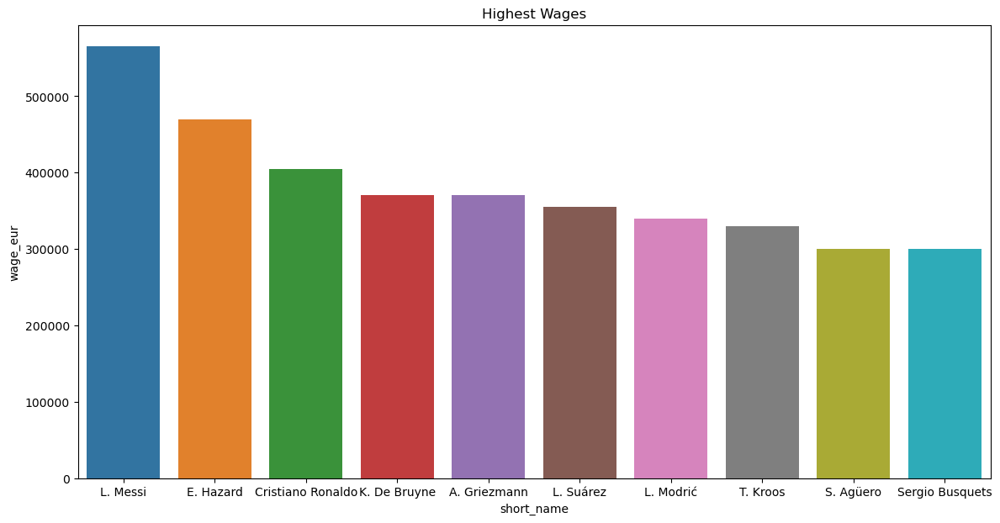

In [203]:
plt.figure(figsize=(14, 7))
sns.barplot(x=high_wage['short_name'].head(10), y=high_wage['wage_eur'].head(10)).set_title("Highest Wages")


In [204]:
print("Min: ", data['wage_eur'].min())
print("Mean: ", data['wage_eur'].mean())
print("Max: ", data['wage_eur'].max())

Min:  0
Mean:  9456.942772732247
Max:  565000


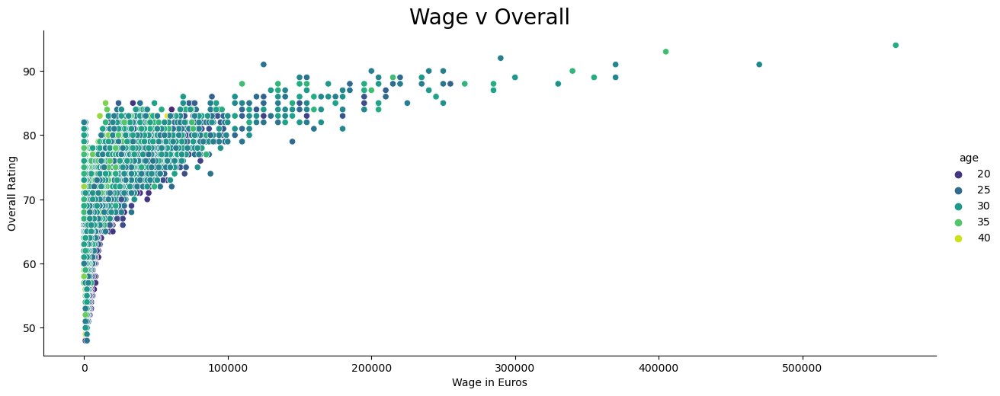

In [205]:
sns.relplot(x='wage_eur',y='overall',hue='age',palette = 'viridis', aspect=2.5,data=data)
plt.title('Wage v Overall',fontsize = 20)
plt.xlabel('Wage in Euros')
plt.ylabel('Overall Rating')
plt.show()

We observe:
1. Wage increases with increase in Overall Rating as depicted by the curve.

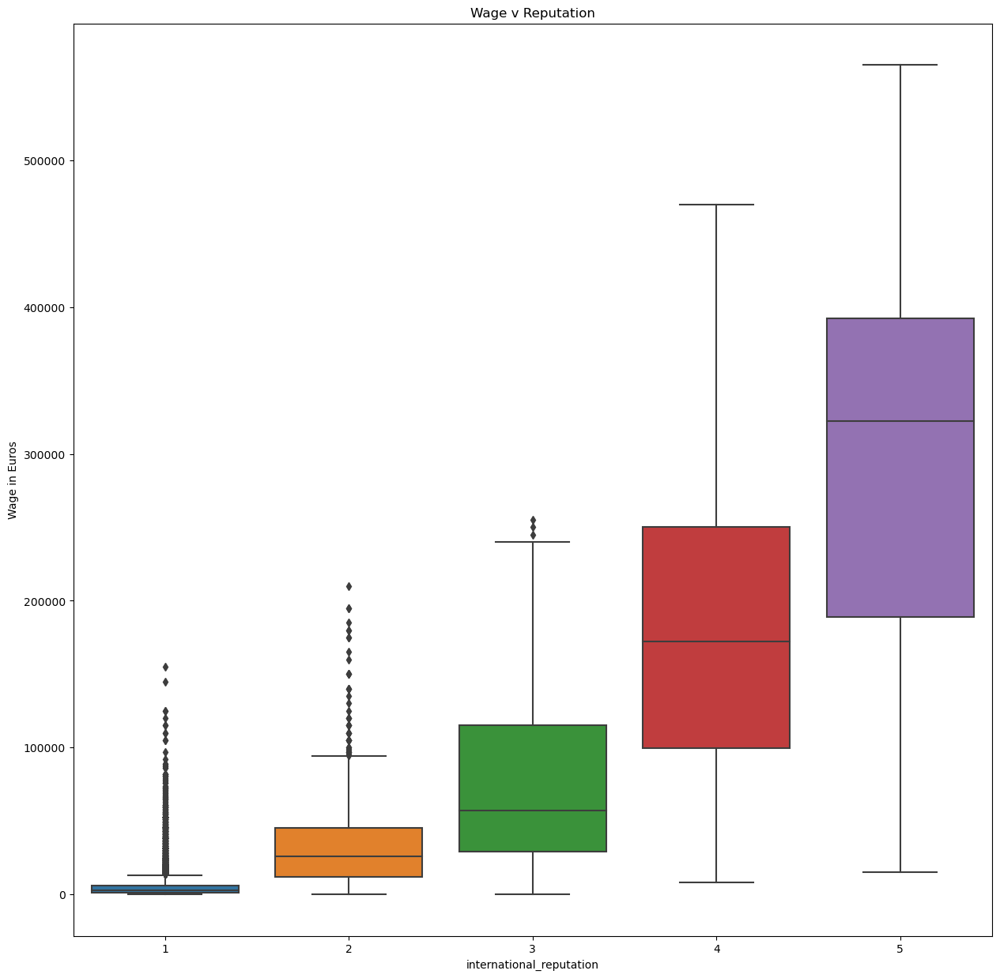

In [206]:
sns.boxplot(y='wage_eur',x='international_reputation',data=data)
plt.title('Wage v Reputation')
plt.ylabel('Wage in Euros')
plt.xlabel('international_reputation')
plt.show()

###### We observe:
###### 1.Range and distribution of wages varies for different reputations. 
###### 2.Mean wage increases with increase in reputation

### Task 2

#### This section covers analysis of few key skills


#### Player's overall rating vs few monetary features

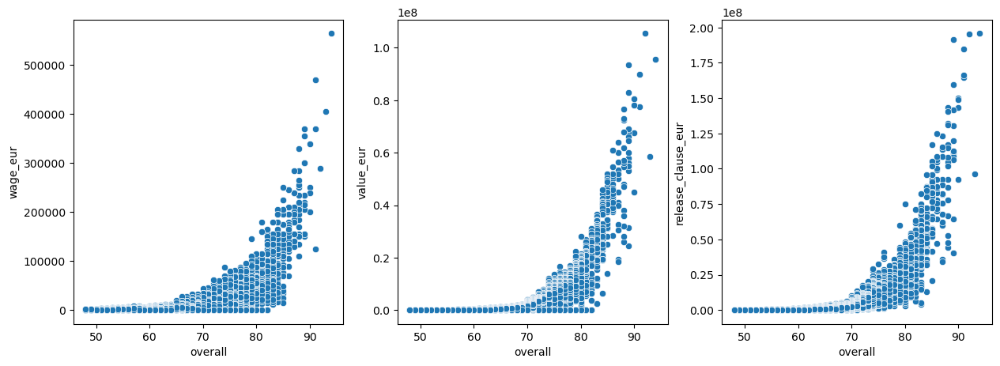

In [207]:
plt.figure(figsize=(15,5))
plt_num = 1
fifa_data_bivar_cols = ["wage_eur", "value_eur", "release_clause_eur"]
for column in fifa_data_bivar_cols:
    if plt_num <= 3:
       plt.subplot(1,3,plt_num)
       sns.scatterplot(x="overall", y=column, data=data)
    plt_num += 1
plt.show()

 1) In general, a player's wage, value and his release clause value increases as their overall ranking increases


#### Player's age vs few skill based ranking features

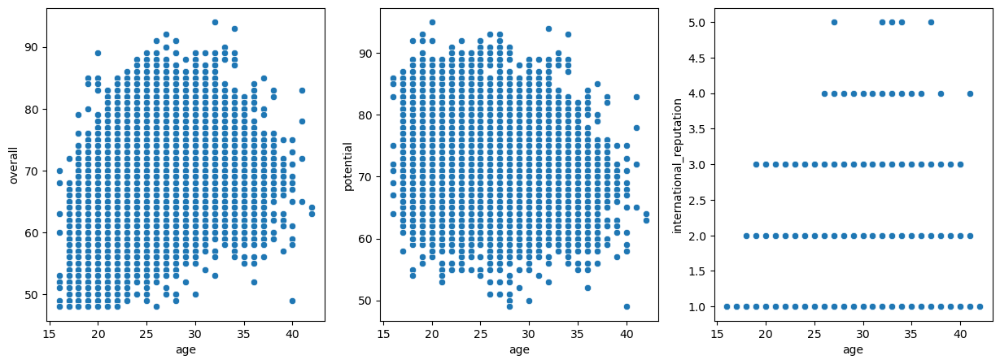

In [208]:
plt.figure(figsize=(15,5))
plt_num = 1
fifa_data_bivar_cols = ["overall", "potential", "international_reputation"]
for column in fifa_data_bivar_cols:
 if  plt_num <= 3:
        plt.subplot(1,3,plt_num)
        sns.scatterplot(x="age", y=column, data=data)
 plt_num += 1
plt.show()

1) Players aged between 20 and 35 usually possess top tier overall and potential rankings
2) Players with reputation ranking 4 and above are less when compared with the reputation 3 or below
2) As the player's age increases beyond 35 years, their overall ranking, potential ranking and reputation ranking decreases

### Players height vs few key skills

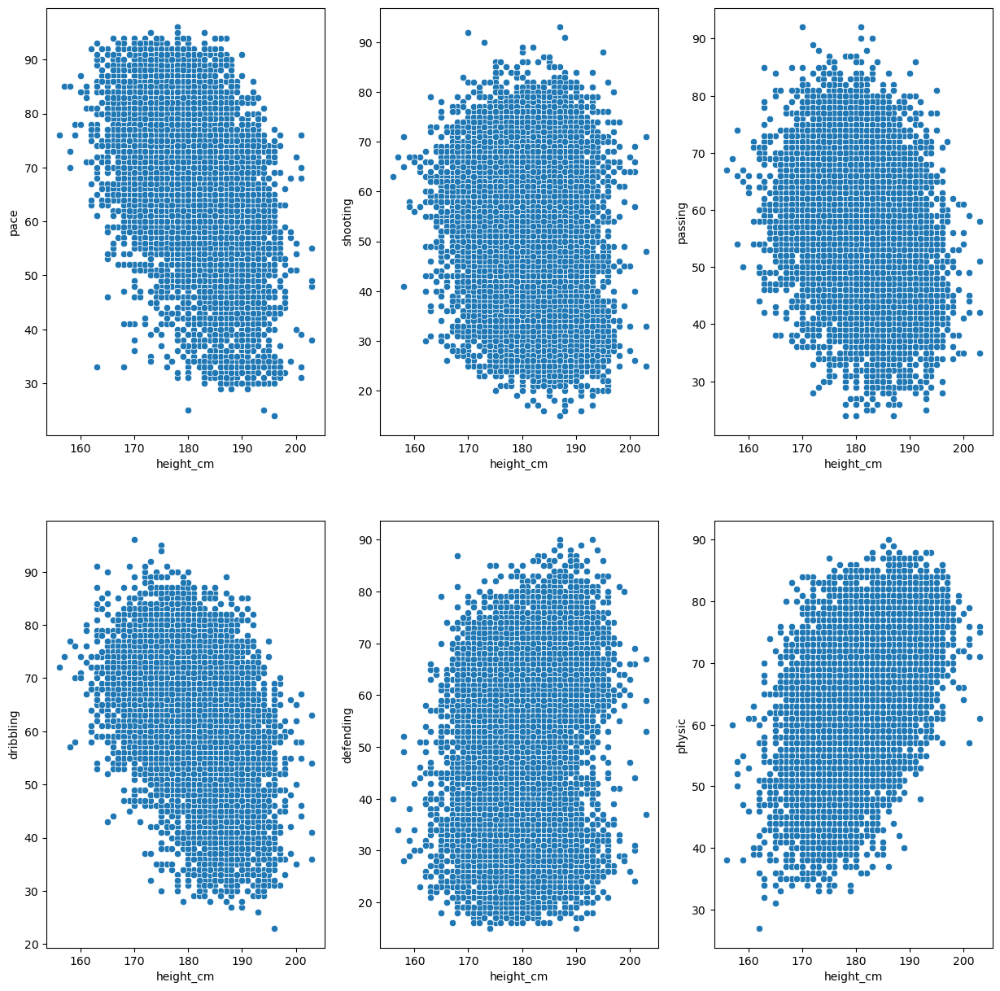

In [209]:
plt.figure(figsize=(15,15))
plt_num = 1
fifa_data_bivar_cols = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]
for column in fifa_data_bivar_cols:
 if    plt_num <= 6:
        plt.subplot(2,3,plt_num)
        sns.scatterplot(x="height_cm", y=column, data=data)
 plt_num += 1
plt.show()

###### 1) As the height of the player increases,

###### a) their pace, passing and dribbling skills get decreased(beyond 190 cm)

###### b) shooting skill is on high for very few players; otherwise it follows a decline as the hieght increases

###### 2) Players with height between 170 to 200 cm tend to have a good physic ranking and defending skill

#### Players weight vs few key skills

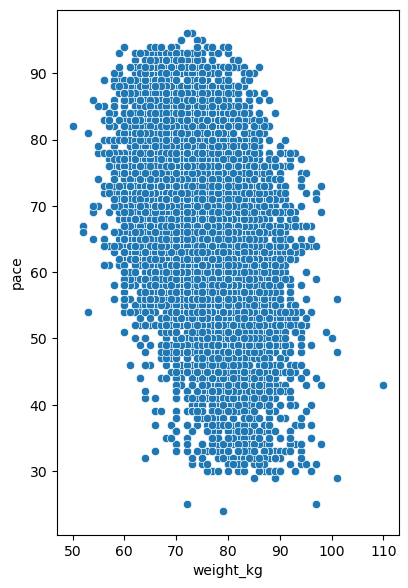

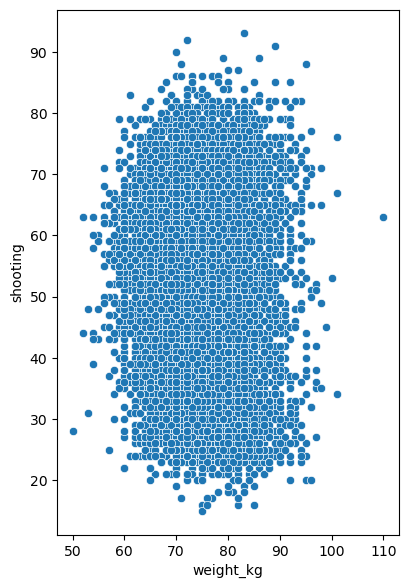

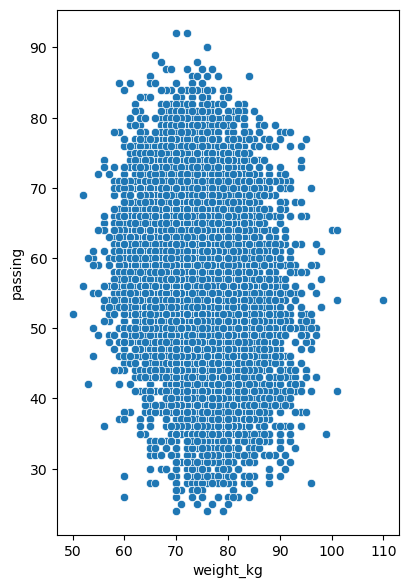

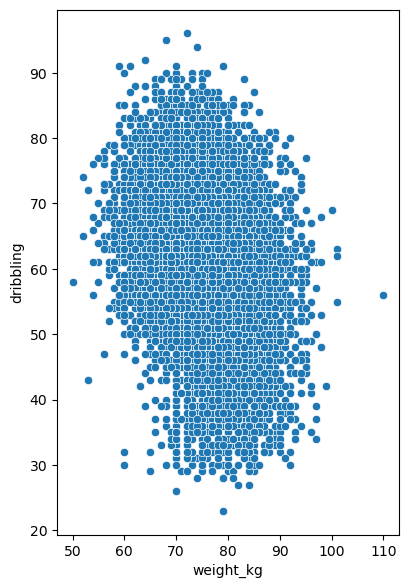

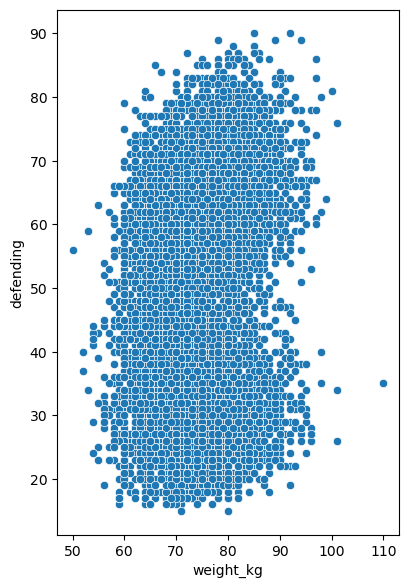

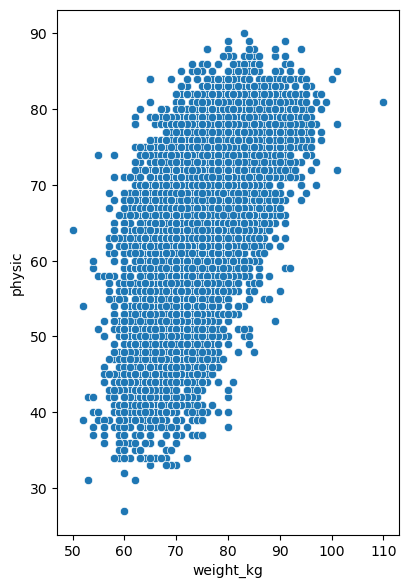

In [210]:
plt.figure(figsize=(15,15))
plt_num = 1
fifa_data_bivar_cols = ["pace", "shooting", "passing", "dribbling", "defending", "physic"]
for column in fifa_data_bivar_cols:
 if    plt_num <= 6:
         plt.subplot(2,3,plt_num)
         sns.scatterplot(x="weight_kg", y=column, data=data)
         plt_num += 1
 plt.show()

1) Players with weight 90 kg and above possess low pace and dribbling skills

2) Except for few players, players who weigh 90 kg and above possess low
dribbling, passing and defending skills 

 3) Players with weight 90kg and above possess high/good physic ranking

#### Player's preferred foot by age

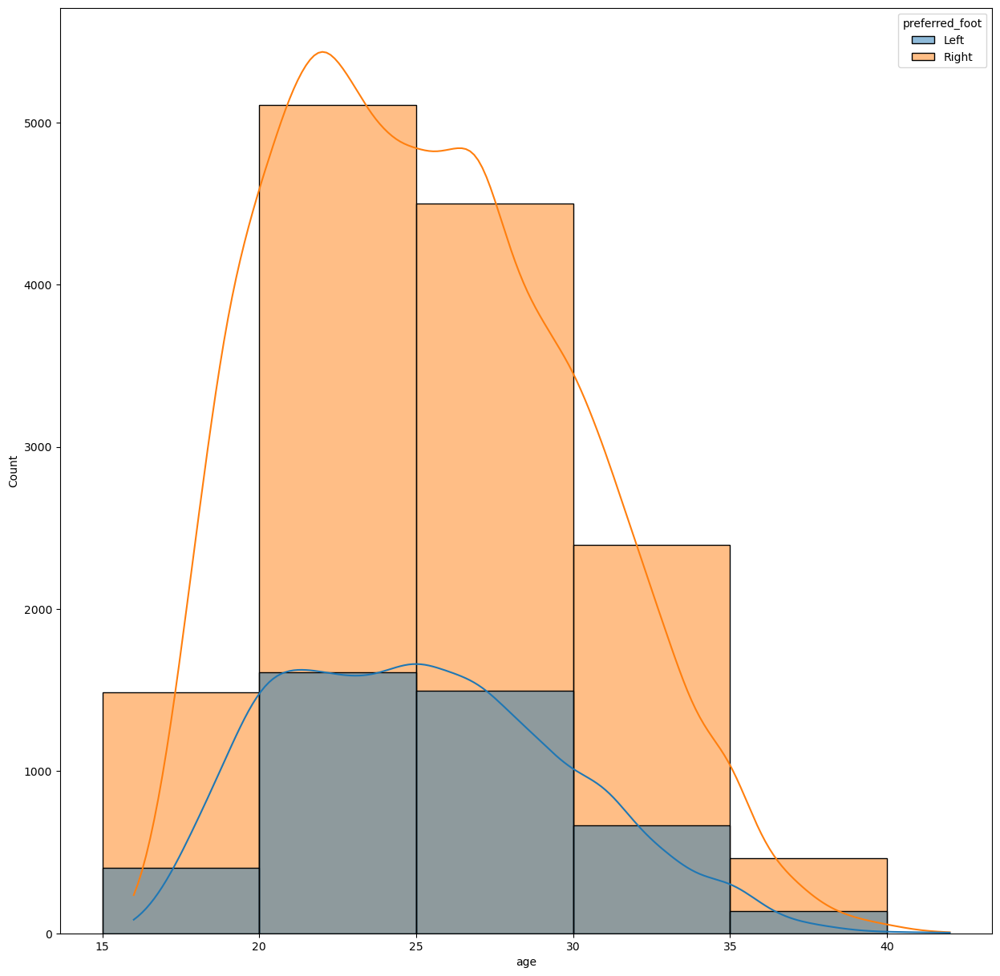

In [211]:
sns.histplot(x="age", data=data, bins=[15,20,25,30,35,40], hue="preferred_foot", kde=True)
plt.show()

1) Players with preferred foot as right foot are more than the players with left foot as the preferred foot

### Task 3

1) Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

In [212]:

# Group the data by nationality
fifa_data_nationality_count = data.groupby(data["nationality"]).count()
# Sort the group in the descending order of count of players
fifa_data_nationality_count_sorted = fifa_data_nationality_count.sort_values(by=["short_name"], ascending=False)
# Rank the top 10 countries with most number of players
fifa_data_nationality_count_sorted["Rank"] = fifa_data_nationality_count_sorted["short_name"].rank(ascending=False)
print(fifa_data_nationality_count_sorted["Rank"].head(10))

nationality
England         1.0
Germany         2.0
Spain           3.0
France          4.0
Argentina       5.0
Brazil          6.0
Italy           7.0
Colombia        8.0
Japan           9.0
Netherlands    10.0
Name: Rank, dtype: float64


Output
Countries that produce the most football players are given below:
 1) England
 2) Germany 
 3) Spain 
 4) France 
 5) Argentina 
 6) Brazil 
 7) Italy 
 8) Colombia 
 9) Japan 
 10) Netherlands

2) Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

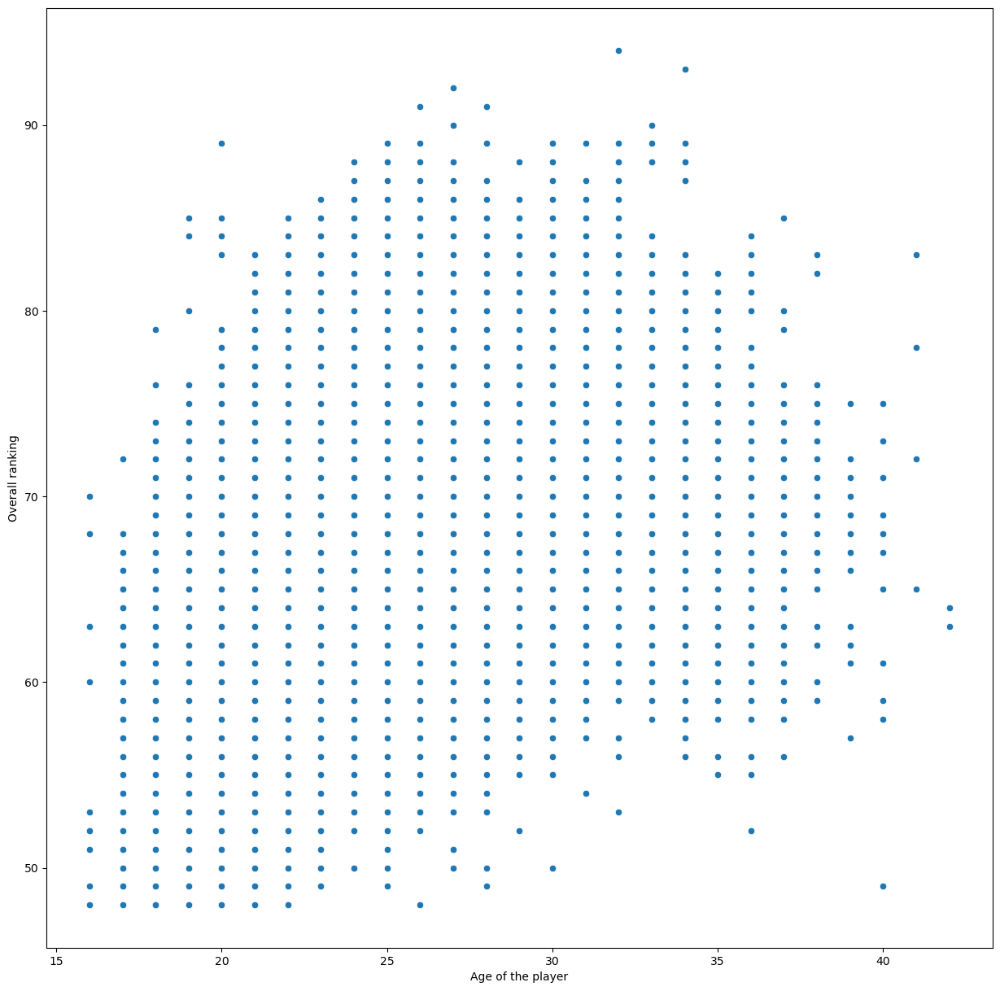

In [213]:
sns.scatterplot(x="age", y="overall", data=data)
plt.xlabel("Age of the player")
plt.ylabel("Overall ranking")
plt.show()

Output

Assuming rank above 85 as superior, we could infer that a player stops improving after the age of 34

3) Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger?

In [214]:
# Extract players who play in Striker position
fifa_data_st = data.loc[data["player_positions"].str.contains("ST")]
# Extract players who play in Right wing position
fifa_data_rw = data.loc[data["player_positions"].str.contains("RW")]
# Extract players who play in Left wing position
fifa_data_lw = data.loc[data["player_positions"].str.contains("LW")]
# Concatenate the data
fifa_data_off_players = pd.concat([fifa_data_st, fifa_data_rw, fifa_data_lw], axis=0, ignore_index=True)


In [215]:
# Create a function to split the positions into separate columns
def player_positions(position):
 pla_posn_len = len(position)
 global pla_posn1, pla_posn2, pla_posn3
 
 if   (pla_posn_len == 2 or pla_posn_len == 3):
       pla_posn1 = position
       pla_posn2 = pla_posn3 = ''
 elif (pla_posn_len >= 4 and pla_posn_len <=8):
       pla_posn1, pla_posn2 = position.split(",")
       pla_posn3 = ''
 else:
       pla_posn1, pla_posn2, pla_posn3 = position.split(",")

In [216]:
# Split each player position into separate column
for row in range(0,len(fifa_data_off_players)):
 fifa_data_off_players.loc[row, ["player_positions"]].apply(player_positions)
 fifa_data_off_players.loc[row, ["pla_posn1"]] = pla_posn1
 fifa_data_off_players.loc[row, ["pla_posn2"]] = pla_posn2.strip()
 fifa_data_off_players.loc[row, ["pla_posn3"]] = pla_posn3.strip()

In [217]:
# View the data created
fifa_data_off_players[["player_positions", "pla_posn1", "pla_posn2", "pla_posn3"]].head()

,player_positions,pla_posn1,pla_posn2,pla_posn3
0,"RW, CF, ST",RW,CF,ST
1,"ST, LW",ST,LW,
2,"RW, ST",RW,ST,
3,"ST, RW",ST,RW,
4,ST,ST,,


In [218]:
offensive_players = ["ST", "LW", "RW"]
fifa_data_off_players_posn1 = fifa_data_off_players.loc[fifa_data_off_players["pla_posn1"].isin(offensive_players)]
fifa_data_off_players_posn2 = fifa_data_off_players.loc[fifa_data_off_players["pla_posn2"].isin(offensive_players)]
fifa_data_off_players_posn3 = fifa_data_off_players.loc[fifa_data_off_players["pla_posn3"].isin(offensive_players)]


3.1) Player position 1 vs wage

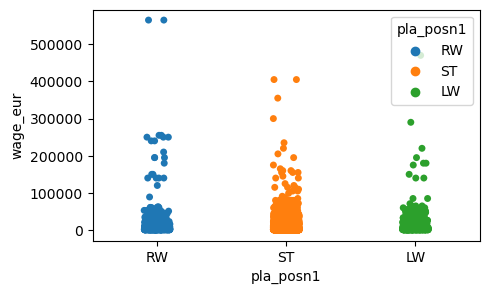

In [219]:
plt.figure(figsize=(5,3))
sns.stripplot(data=fifa_data_off_players_posn1, x="pla_posn1", y="wage_eur", hue="pla_posn1")
plt.show()

3.1) Inference
1) Right Wingers(RW) are paid more than the Strikers(ST) and the Left Wingers(LW)

3.2) Player position 2 vs wage

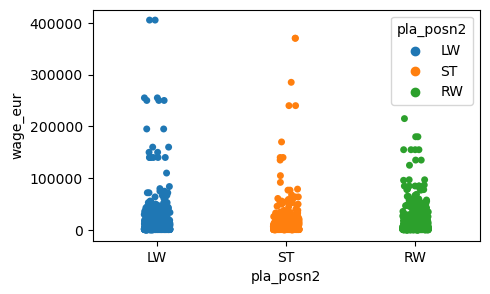

In [220]:
plt.figure(figsize=(5,3))
sns.stripplot(data=fifa_data_off_players_posn2, x="pla_posn2", y="wage_eur", hue="pla_posn2")
plt.show()

3.2) Inference
1) Left Wingers(LW) are paid more than the Strikers(ST) and Right Wingers(RW)



3.3) Player position 3 vs wage


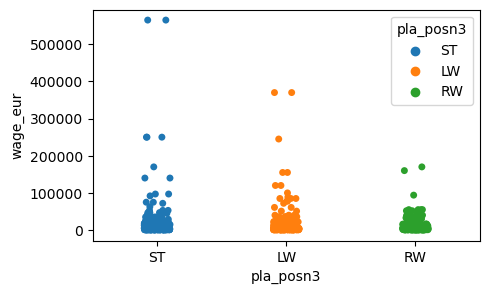

In [221]:
plt.figure(figsize=(5,3))
sns.stripplot(data=fifa_data_off_players_posn3, x="pla_posn3", y="wage_eur", hue="pla_posn3")
plt.show()


3.3) Inference
1) Looking at the 3 visuals created, we could say that on an average, Strikers(ST) are paid more than the Left Wingers(LW) and Right Wingers(RW)


Output

1) By referring the above 3 graphs, we could say that

a) Strikers(ST) are paid the highest wage

b) Left Wingers(LW) are paid the second most highest wage

c) Right Wingers(RW) are paid the least wage when compared with other offensive positions[Striker(ST) and Right Winger(RW)]

### Model Creation

In [222]:
data.player_positions[35:45]

35             CB
36             CM
37    CAM, LM, ST
38         ST, LM
39         LW, LM
40         CB, LB
41    RW, CAM, CM
42            CDM
43         CF, LM
44            CDM
Name: player_positions, dtype: object

In [223]:
def combine_positions(row):
    # There are 15 different positions
    positions = row['player_positions'].split(', ')
    N = len(positions)
    if N < 3:
        # If a player has two positions the first one will be considered as their
        # position, of course, players with only one position won't be affected
        position = positions[0]
        if position in ['ST', 'LW', 'RW','CF']: #4
            return 0 #ATTACKER
        elif position in ['CAM', 'LM', 'CM', 'RM', 'CDM']: #5
            return 1 #MIDFIELDER
        elif position in ['LWB', 'RWB', 'LB', 'CB', 'RB']: #5
            return 2 #DEFENDER
        elif position in ['GK']: #1
            return 3 #GOALKEEPER
    else: # If player has three possible positions
        position_count = [0, 0, 0, 0]
        for position in positions:
            if position in ['ST', 'LW', 'RW','CF']: #4
                index = 0 #ATTACKER
            elif position in ['CAM', 'LM', 'CM', 'RM', 'CDM']: #5
                index = 1 #MIDFIELDER
            elif position in ['LWB', 'RWB', 'LB', 'CB', 'RB']: #5
                index = 2 #DEFENDER
            elif position in ['GK']: #1
                index = 3 #GOALKEEPER
            else:
                continue
            position_count[index] += 1
        # This will count which was the most repeated position and assign it
        # to the player
        return position_count.index(max(position_count))
data['player_positions'] = data.apply(combine_positions, axis=1)

Skew of the distribution is 0.07089343291701235
Kurtosis of the distribution is 0.05761583098542822


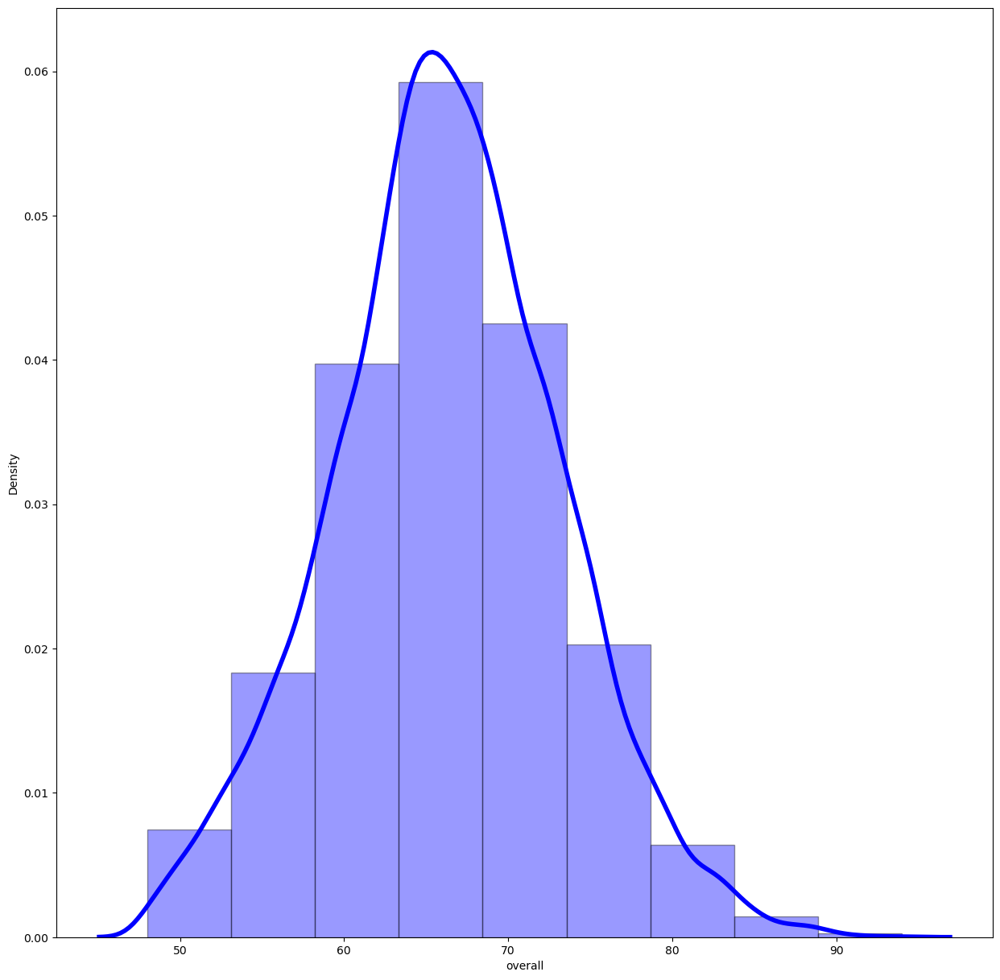

In [224]:
bins = np.linspace(data.overall.min(), data.overall.max(), 10)
sns.distplot(data['overall'], hist=True,
 bins=bins, color = 'blue',
 hist_kws={'edgecolor':'black'},
 kde_kws={'linewidth': 4})
print('Skew of the distribution is', data['overall'].skew())
print('Kurtosis of the distribution is', data['overall'].kurt())

In [225]:
df = data[['skill_moves', 'player_positions', 'attacking_crossing', 'attacking_finishing',
 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys',
 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power',
 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning',
 'mentality_vision', 'mentality_penalties', 'mentality_composure',
 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle',
 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
 'goalkeeping_positioning', 'goalkeeping_reflexes']]

In [226]:
df.isnull().sum()

skill_moves                   0
player_positions              0
attacking_crossing            0
attacking_finishing           0
attacking_heading_accuracy    0
attacking_short_passing       0
attacking_volleys             0
skill_dribbling               0
skill_curve                   0
skill_fk_accuracy             0
skill_long_passing            0
skill_ball_control            0
movement_acceleration         0
movement_sprint_speed         0
movement_agility              0
movement_reactions            0
movement_balance              0
power_shot_power              0
power_jumping                 0
power_stamina                 0
power_strength                0
power_long_shots              0
mentality_aggression          0
mentality_interceptions       0
mentality_positioning         0
mentality_vision              0
mentality_penalties           0
mentality_composure           0
defending_marking             0
defending_standing_tackle     0
defending_sliding_tackle      0
goalkeep

### K-Nearest Neighbors

In [227]:
from sklearn.model_selection import train_test_split

In [228]:
# Create X and y
X = df.drop(["player_positions"],axis = 1)
y = df.player_positions

In [229]:
# Split the data to 80-20
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42, stratify=y)

In [230]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


In [231]:
from sklearn.neighbors import KNeighborsClassifier
pipe_knn = Pipeline([
 ('sc', StandardScaler()),
 ('knn', KNeighborsClassifier())
 ])
params_knn = {
 'knn__n_neighbors': range(1, 20)
 }
search_knn = GridSearchCV(estimator=pipe_knn,
 param_grid=params_knn,
cv = 5,
 return_train_score=True)
search_knn.fit(X_train, y_train)
print(f" Best score is: {search_knn.best_score_} with parameters: {search_knn.best_params_}")

 Best score is: 0.8800440328785062 with parameters: {'knn__n_neighbors': 19}


In [232]:
knn = KNeighborsClassifier(n_neighbors = 19)
# Train the model
knn.fit(X_train, y_train)
# Get the predict value from X_test
y_pred_knn = knn.predict(X_test)


In [233]:
 from sklearn import metrics
from sklearn.metrics import classification_report

In [234]:
# Report
print(classification_report(y_pred_knn,y_test, digits = 3))
print('accuracy: ', metrics.accuracy_score(y_pred_knn, y_test))



              precision    recall  f1-score   support

           0      0.731     0.870     0.794       586
           1      0.893     0.819     0.854      1500
           2      0.922     0.932     0.927      1163
           3      1.000     1.000     1.000       407

    accuracy                          0.883      3656
   macro avg      0.886     0.905     0.894      3656
weighted avg      0.888     0.883     0.884      3656

accuracy:  0.8832056892778993


In [235]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

Confusion matrix, without normalization
[[ 510  180    8    0]
 [  76 1228   71    0]
 [   0   92 1084    0]
 [   0    0    0  407]]
Normalized confusion matrix
[[0.73065903 0.25787966 0.01146132 0.        ]
 [0.05527273 0.89309091 0.05163636 0.        ]
 [0.         0.07823129 0.92176871 0.        ]
 [0.         0.         0.         1.        ]]


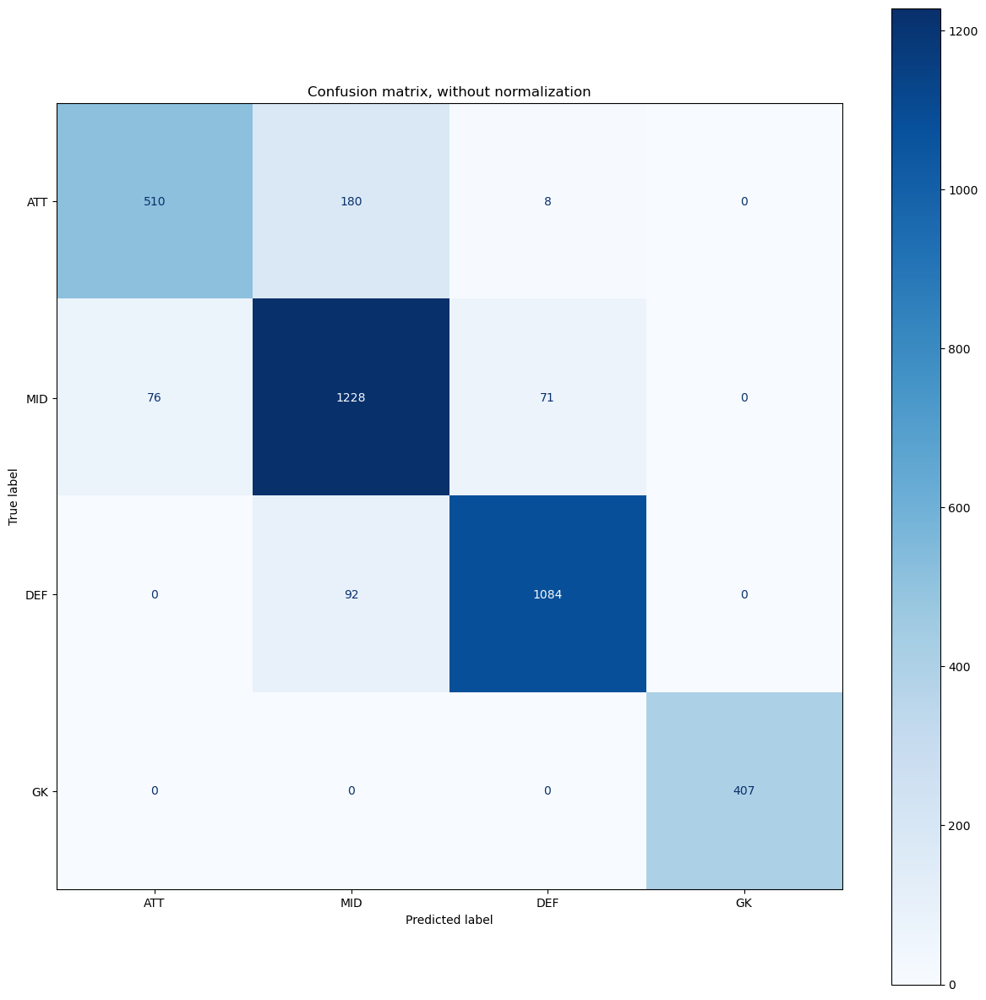

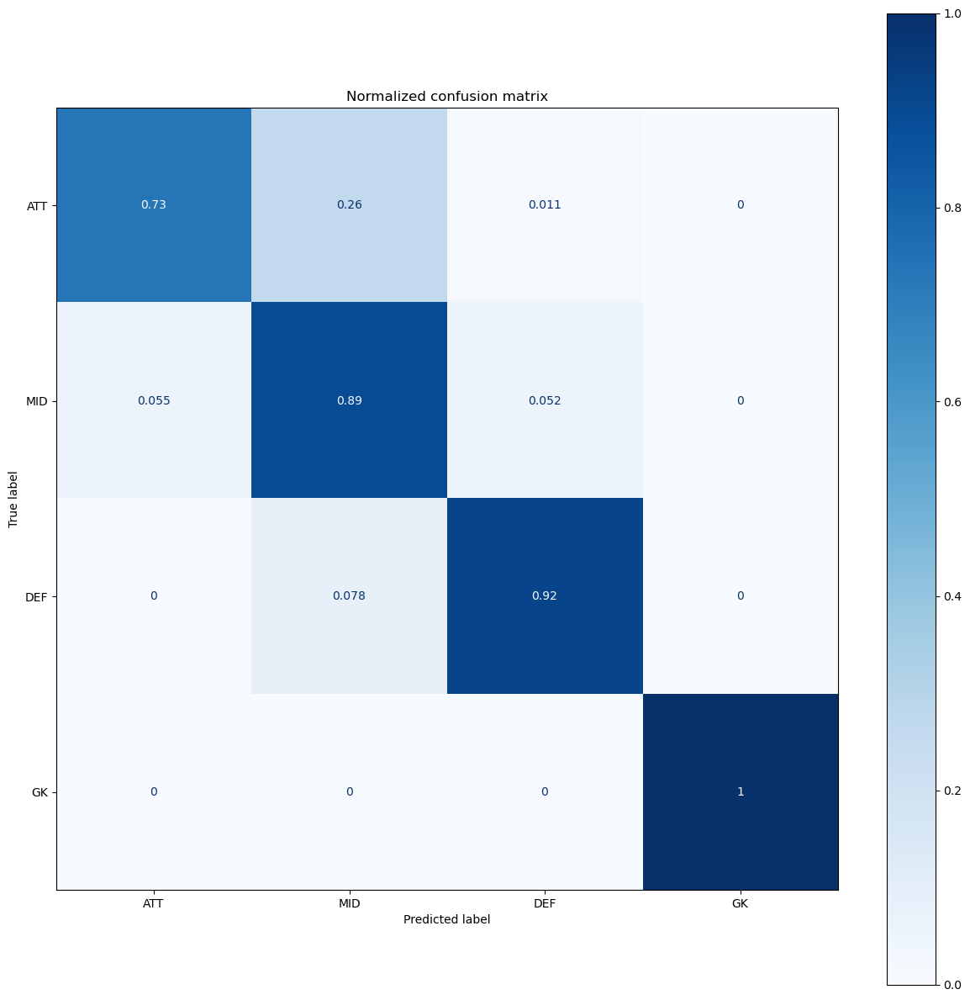

In [236]:
# Plot non-normalized confusion matrix
titles_options = [
 ("Confusion matrix, without normalization", None),
 ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
 disp = ConfusionMatrixDisplay.from_estimator(
 knn.fit(X_train, y_train),
 X_test,
 y_test,
 display_labels=['ATT', 'MID', 'DEF', 'GK'],
 cmap=plt.cm.Blues,
 normalize=normalize,
 )
 disp.ax_.set_title(title)
 print(title)
 print(disp.confusion_matrix)
plt.show()

### Decision Tree

In [237]:
from sklearn.tree import DecisionTreeClassifier
import numpy as np
pipe_decsT = Pipeline([
 ('sc', StandardScaler()),
 ('decsT', DecisionTreeClassifier())
 ])
params_decsT = {
 'decsT__criterion' : ['gini', 'entropy'],
 'decsT__max_depth' : np.arange(3, 15)
 }
search_decsT = GridSearchCV(estimator=pipe_decsT,
 param_grid=params_decsT,
cv = 5,
 return_train_score=True)
search_decsT.fit(X_train, y_train)
print(f" Best score is: {search_decsT.best_score_} with parameters: {search_decsT.best_params_}")

 Best score is: 0.8587753574894478 with parameters: {'decsT__criterion': 'gini', 'decsT__max_depth': 8}


In [238]:
scores_decsT = search_decsT.cv_results_['mean_test_score']
criterion = ['gini', 'entropy']
DEPTH = np.arange(3, 15)
for idx, criterion in enumerate(criterion):
    for score, depth in (zip(scores_decsT[idx*len(DEPTH): (idx+1)*len(DEPTH)], DEPTH)):
        print(f"{depth, criterion}: {score:.10f}")

(3, 'gini'): 0.7779377740
(4, 'gini'): 0.8208182445
(5, 'gini'): 0.8384623569
(6, 'gini'): 0.8515254130
(7, 'gini'): 0.8573388988
(8, 'gini'): 0.8587753575
(9, 'gini'): 0.8587068411
(10, 'gini'): 0.8549459001
(11, 'gini'): 0.8504999825
(12, 'gini'): 0.8479692729
(13, 'gini'): 0.8433868603
(14, 'gini'): 0.8418138600
(3, 'entropy'): 0.7670642487
(4, 'entropy'): 0.8184925930
(5, 'entropy'): 0.8210908134
(6, 'entropy'): 0.8437282496
(7, 'entropy'): 0.8528923966
(8, 'entropy'): 0.8564487004
(9, 'entropy'): 0.8528242309
(10, 'entropy'): 0.8485160476
(11, 'entropy'): 0.8461230255
(12, 'entropy'): 0.8396934769
(13, 'entropy'): 0.8413341050
(14, 'entropy'): 0.8361371029


In [239]:
decsT = DecisionTreeClassifier(max_depth=8)
decsT.fit(X_train,y_train)
y_pred_decsT = decsT.predict(X_test)

In [240]:
#Report
print(classification_report(y_pred_decsT,y_test, digits = 3))
print('accuracy: ', metrics.accuracy_score(y_pred_decsT,y_test))

              precision    recall  f1-score   support

           0      0.744     0.824     0.782       630
           1      0.841     0.798     0.819      1449
           2      0.890     0.895     0.893      1170
           3      1.000     1.000     1.000       407

    accuracy                          0.856      3656
   macro avg      0.869     0.879     0.873      3656
weighted avg      0.858     0.856     0.856      3656

accuracy:  0.8561269146608315


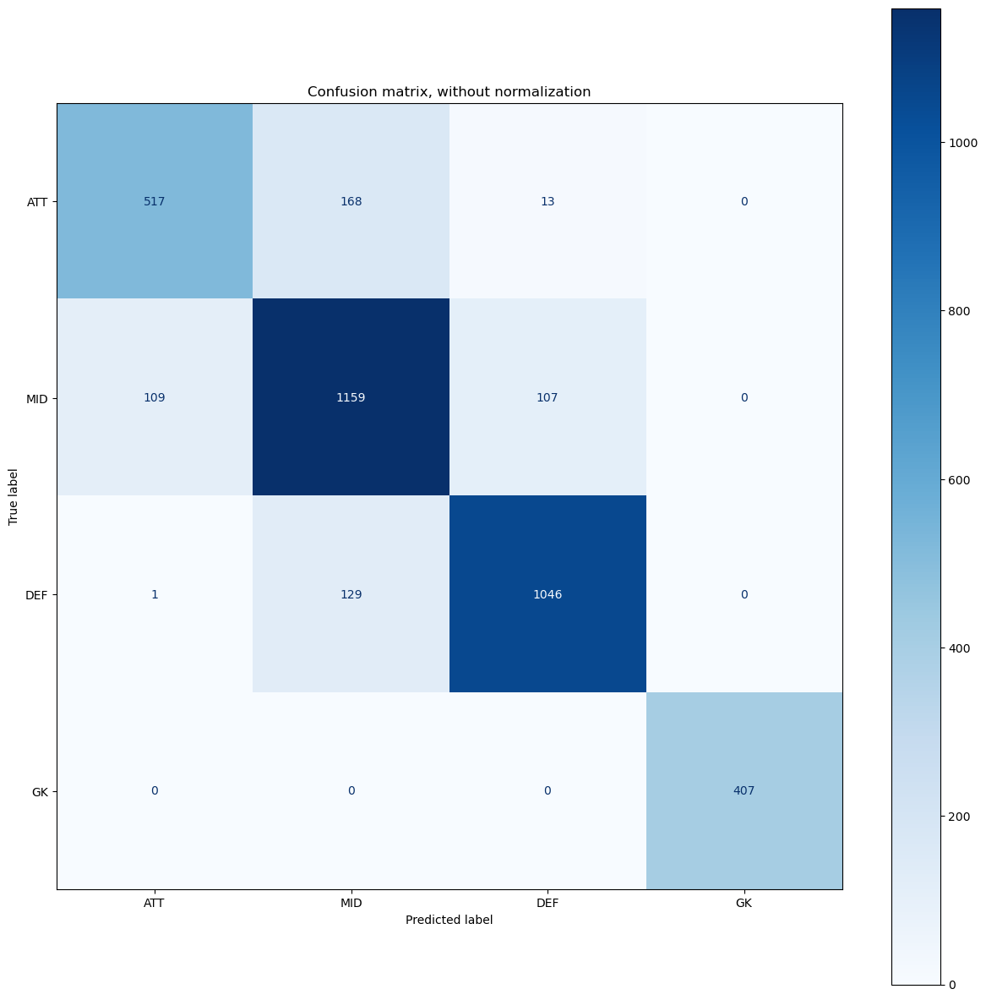

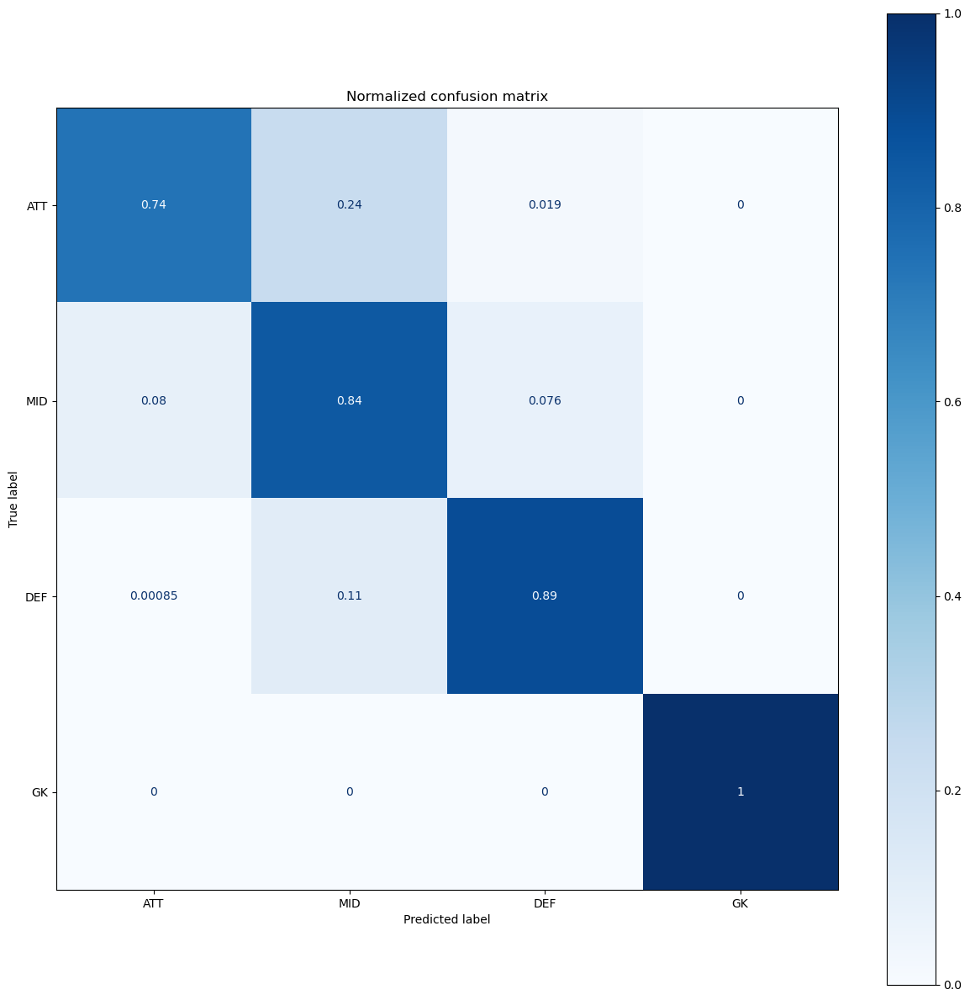

In [241]:
for title, normalize in titles_options:
 disp = ConfusionMatrixDisplay.from_estimator(decsT.fit(X_train, y_train), X_test, y_test,
 display_labels=['ATT', 'MID', 'DEF', 'GK'],
 cmap='Blues',
normalize=normalize)
 disp.ax_.set_title(title)

Confusion matrix, without normalization
[[ 518  166   14    0]
 [ 108 1159  108    0]
 [   1  129 1046    0]
 [   0    0    0  407]]
Normalized confusion matrix
[[7.42120344e-01 2.39255014e-01 1.86246418e-02 0.00000000e+00]
 [7.78181818e-02 8.46545455e-01 7.56363636e-02 0.00000000e+00]
 [8.50340136e-04 1.10544218e-01 8.88605442e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00]]


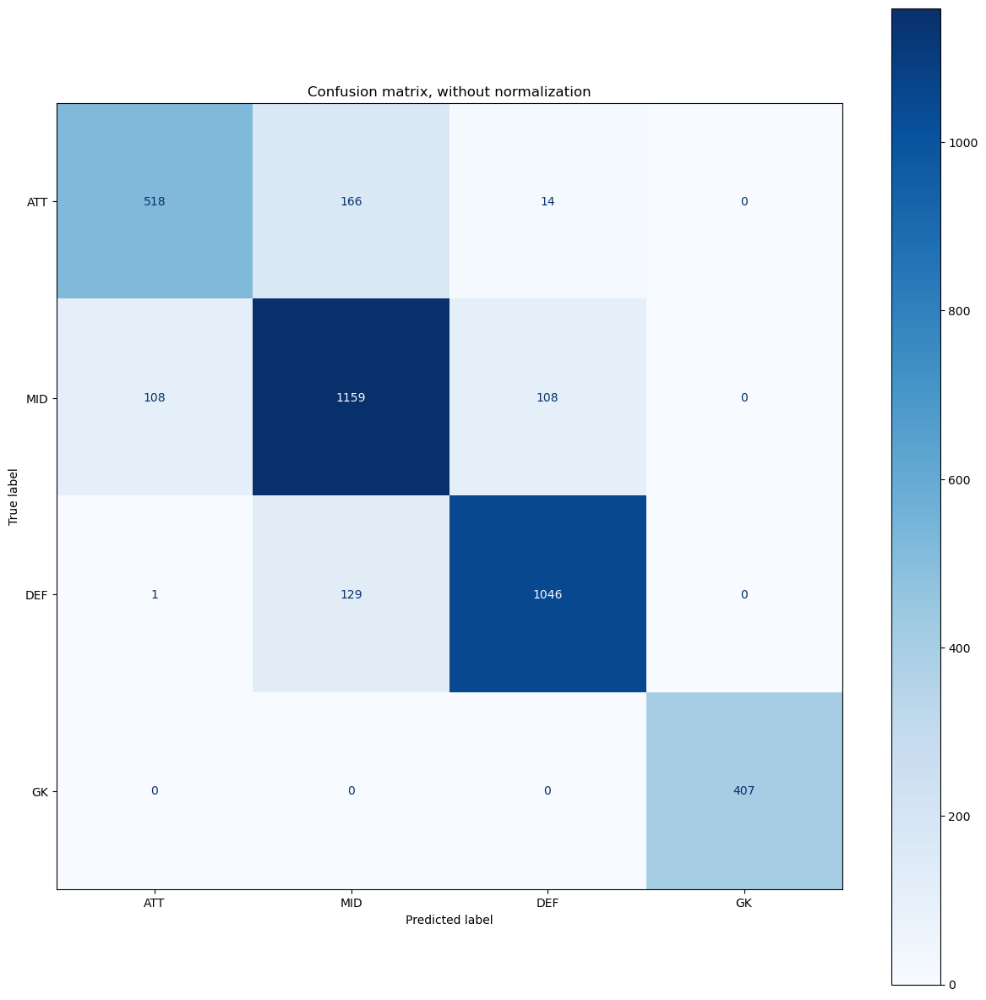

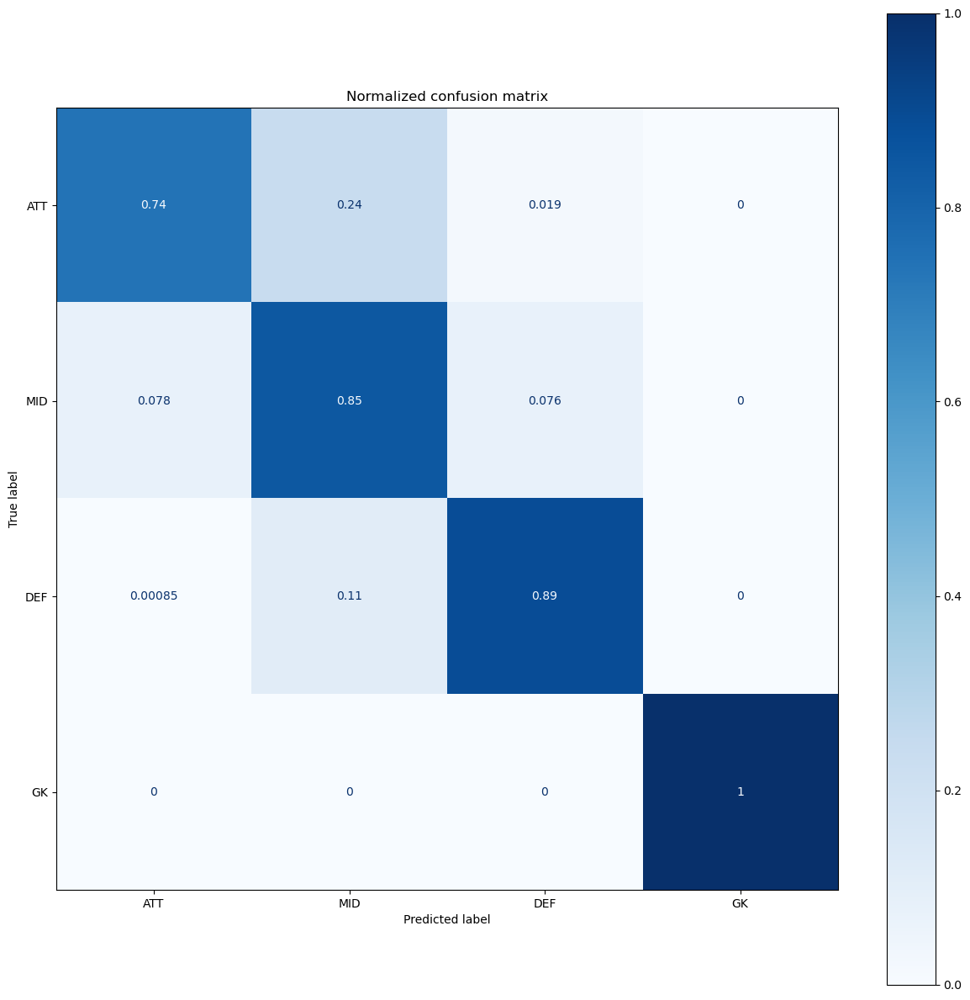

In [242]:
# Plot non-normalized confusion matrix
titles_options = [
    ("Confusion matrix, without normalization", None),
    ("Normalized confusion matrix", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        decsT.fit(X_train, y_train),
        X_test,
        y_test,
        display_labels=['ATT', 'MID', 'DEF', 'GK'],
        cmap=plt.cm.Blues,
        normalize=normalize,
    )
    disp.ax_.set_title(title)
     
    print(title)
    print(disp.confusion_matrix)

plt.show()

### SVC

In [243]:
from sklearn.svm import SVC
import numpy as np
kernels = ['rbf', 'poly', 'sigmoid']
C = np.logspace(-2, 10, 13)
pipe_svm = Pipeline([
 ('sc', StandardScaler()),
 ('SVM', SVC())
    
 ])
params_svm = {'SVM__C': C,
 'SVM__kernel': kernels,
 }
search_svm = GridSearchCV(estimator=pipe_svm,
 param_grid=params_svm,
cv = 5,
 return_train_score=True)
search_svm.fit(X_train, y_train)
print(f" Best score is: {search_svm.best_score_} with parameters: {search_svm.best_params_}")

 Best score is: 0.9004240532229588 with parameters: {'SVM__C': 1.0, 'SVM__kernel': 'rbf'}


In [244]:
svc = SVC()
svc.fit(X_train,y_train)
y_pred_svm = svc.predict(X_test)


In [245]:
# Report
print(metrics.classification_report(y_pred_svm,y_test, digits = 3))
print('accuracy: ', metrics.accuracy_score(y_pred_svm,y_test))


              precision    recall  f1-score   support

           0      0.748     0.894     0.814       584
           1      0.898     0.840     0.868      1471
           2      0.942     0.928     0.935      1194
           3      1.000     1.000     1.000       407

    accuracy                          0.895      3656
   macro avg      0.897     0.915     0.904      3656
weighted avg      0.900     0.895     0.896      3656

accuracy:  0.8949671772428884


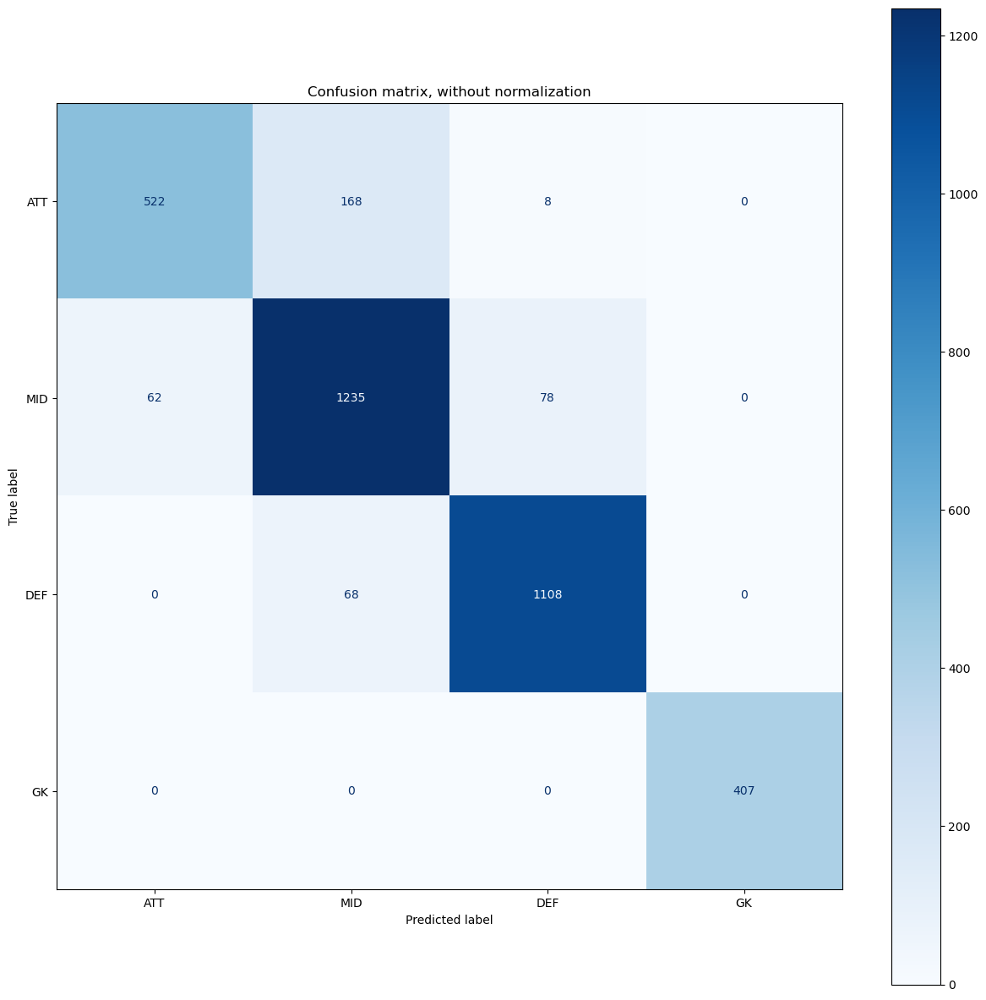

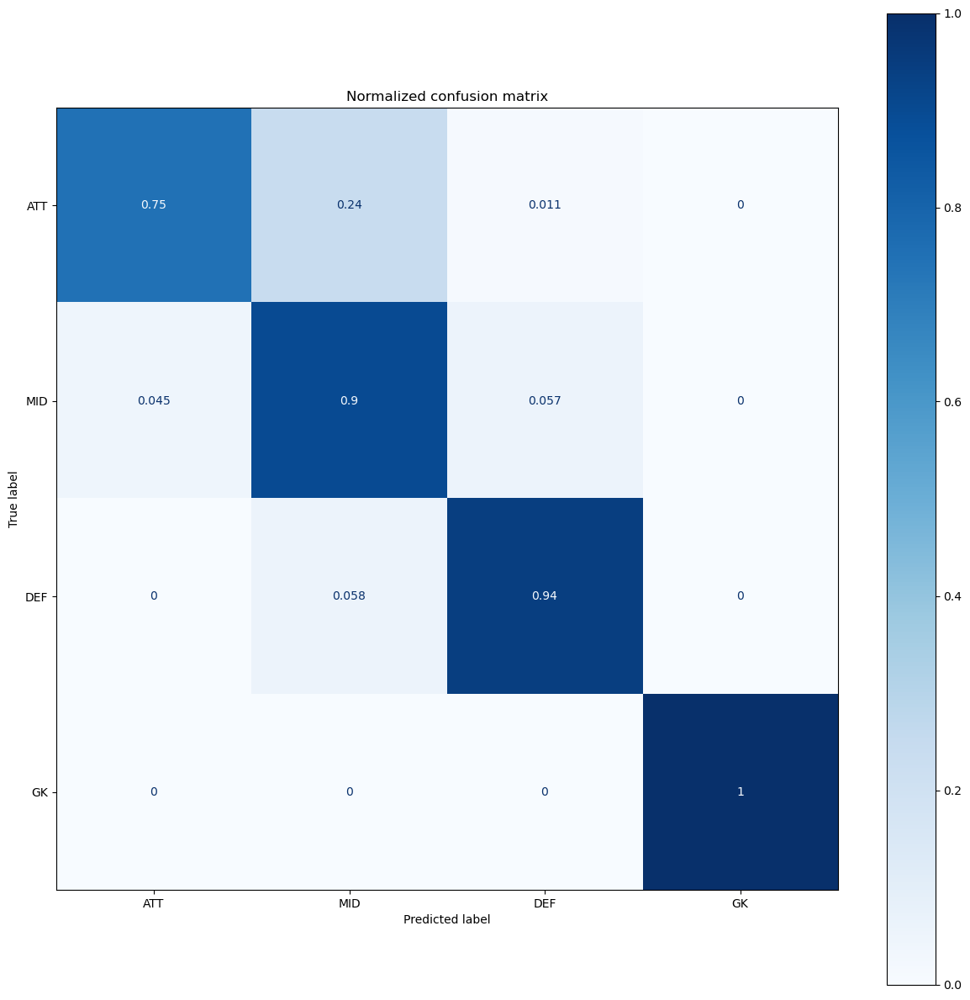

In [246]:
for title, normalize in titles_options:
 disp = ConfusionMatrixDisplay.from_estimator(svc.fit(X_train, y_train), X_test, y_test,
 display_labels=['ATT', 'MID', 'DEF', 'GK'],
 cmap='Blues',
normalize=normalize)
 disp.ax_.set_title(title)

### Logistic Regression

In [247]:
from sklearn.linear_model import LogisticRegression
solver = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
C = np.logspace(-2, 10, 13)
pipe_lr = Pipeline([
 ('sc', StandardScaler()),
 ('LR', LogisticRegression())
 ])
params_lr = {
 'LR__C': C,
 'LR__solver': solver
 }
search_lr = GridSearchCV(estimator=pipe_lr,
 param_grid=params_lr,
cv = 5,
 return_train_score=True)
search_lr.fit(X_train, y_train)
print(f" Best score is: {search_lr.best_score_} with parameters: {search_lr.best_params_}")

 Best score is: 0.8888655044605797 with parameters: {'LR__C': 10.0, 'LR__solver': 'newton-cg'}


In [248]:
lr = LogisticRegression(C=10, solver='newton-cg')
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)

In [249]:
# Report
print(metrics.classification_report(y_pred_lr,y_test, digits = 3))
print('accuracy: ', metrics.accuracy_score(y_pred_lr,y_test))

              precision    recall  f1-score   support

           0      0.775     0.853     0.812       634
           1      0.869     0.836     0.852      1429
           2      0.930     0.922     0.926      1186
           3      1.000     1.000     1.000       407

    accuracy                          0.885      3656
   macro avg      0.894     0.903     0.898      3656
weighted avg      0.887     0.885     0.886      3656

accuracy:  0.8853938730853391


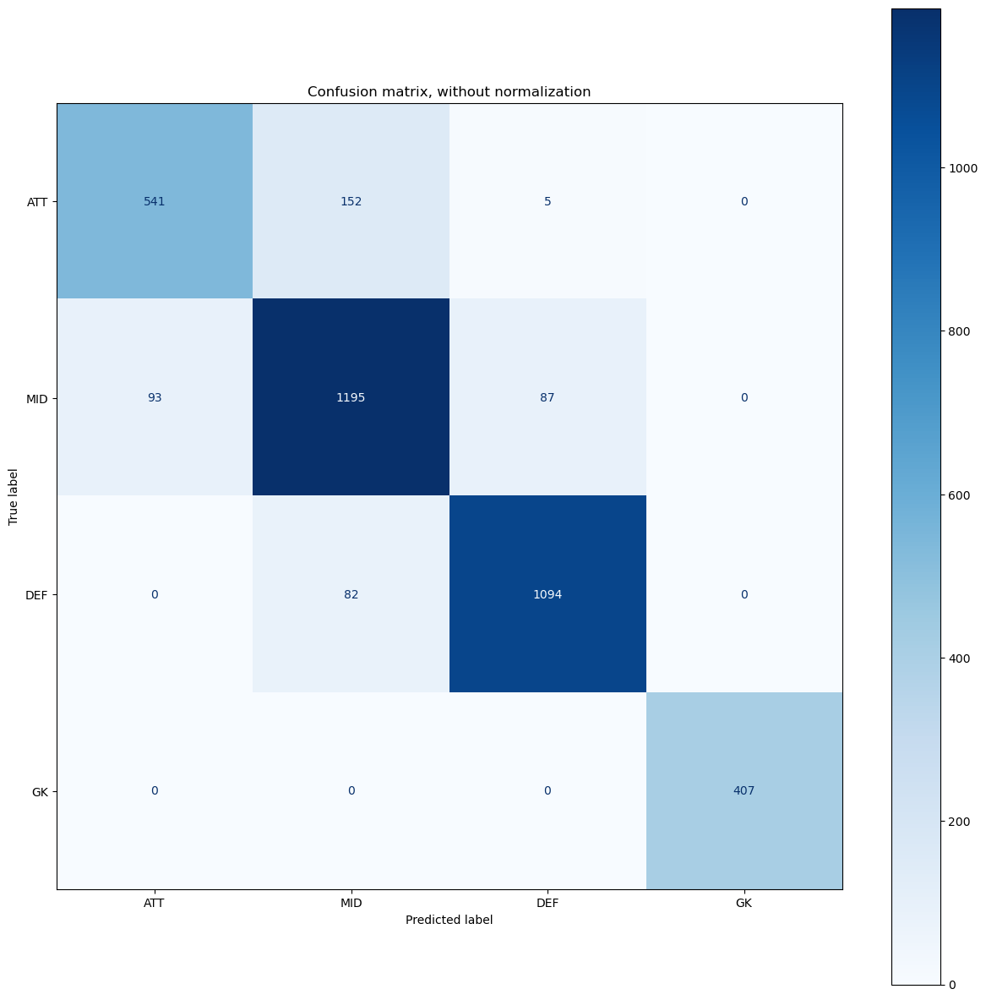

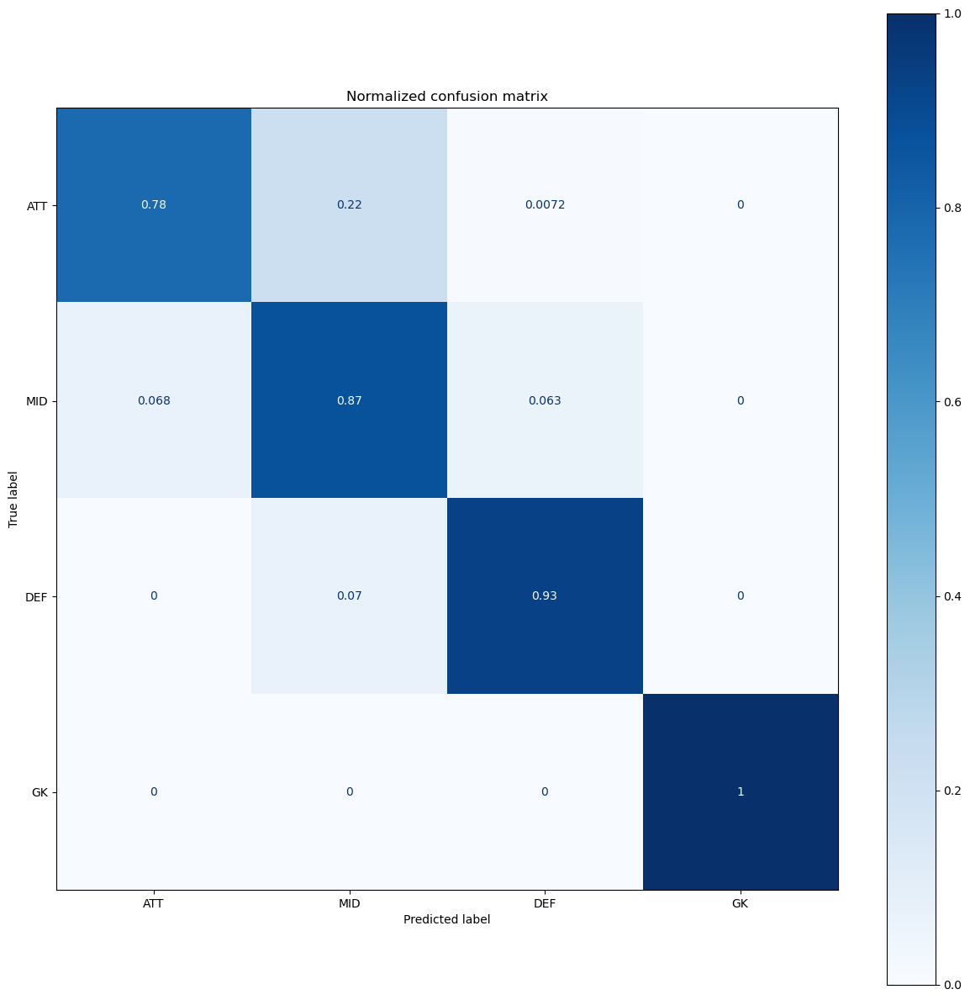

In [250]:
for title, normalize in titles_options:
 disp = ConfusionMatrixDisplay.from_estimator(lr.fit(X_train, y_train), X_test, y_test,
 display_labels=['ATT', 'MID', 'DEF', 'GK'],
 cmap='Blues',
normalize=normalize)
 disp.ax_.set_title(title)


### Model Comparison Report

In [251]:
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss
# Evaluate KNN 
jc1 = (jaccard_score(y_test, y_pred_knn, average='weighted'))
fs1 = (f1_score(y_test, y_pred_knn,average='weighted'))
# Evaluate Decision Trees
jc2 = (jaccard_score(y_test, y_pred_decsT, average='weighted'))
fs2 = (f1_score(y_test, y_pred_decsT, average='weighted'))
# Evaluate SVM
jc3 = (jaccard_score(y_test, y_pred_svm, average='weighted'))
fs3 = (f1_score(y_test, y_pred_svm, average='weighted'))
# Evaluate Logistic Regression
jc4 = (jaccard_score(y_test, y_pred_lr, average='weighted'))
fs4 = (f1_score(y_test, y_pred_lr, average='weighted'))
LR_yhat_prob = lr.predict_proba(X_test)
list_jc = [jc1, jc2, jc3, jc4]
list_fs = [fs1, fs2, fs3, fs4]
list_ll = ['NA', 'NA', 'NA',(log_loss(y_test, LR_yhat_prob))]

In [252]:
# fomulate the report format
report = pd.DataFrame( list_jc,index=['KNN','Decision Tree','SVM','Logistic Regression'])
report.columns = ['Jaccard']
report.insert(loc=1, column='F1-score', value=list_fs)
report.insert(loc=2, column='LogLoss', value=list_ll)
report.columns.name = 'Algorithm'
report

Algorithm,Jaccard,F1-score,LogLoss
KNN,0.795373,0.882418,NA
Decision Tree,0.754099,0.855836,NA
SVM,0.813181,0.893967,NA
Logistic Regression,0.798749,0.884942,0.282962


In [253]:
knn_fit = search_knn.cv_results_['mean_fit_time'].sum()
decsT_fit = search_decsT.cv_results_['mean_fit_time'].sum()
svm_fit = search_svm.cv_results_['mean_fit_time'].sum()
lr_fit = search_lr.cv_results_['mean_fit_time'].sum()
knn_score = search_knn.cv_results_['mean_score_time'].sum()
decsT_score = search_decsT.cv_results_['mean_score_time'].sum()
svm_score = search_svm.cv_results_['mean_score_time'].sum()
lr_score = search_lr.cv_results_['mean_score_time'].sum()
time_knn = knn_fit + knn_score
time_decsT = decsT_fit + decsT_score
time_svm = svm_fit + svm_score
time_lr = lr_fit + lr_score
time_fit = [knn_fit, decsT_fit, svm_fit, lr_fit]
time_score = [knn_score, decsT_score, svm_score, lr_score]
time_fit = [time_knn, time_decsT, time_svm, time_lr]
total_time = [5*x for x in time_fit]
time_report = pd.DataFrame( time_fit,index=['KNN','Decision Tree','SVM','Logistic Regression'])
time_report.columns = ['Time for fit']
time_report.insert(loc=1, column='Time for score', value=time_score)
time_report.insert(loc=2, column='Time per k-fold', value=time_fit)
time_report.insert(loc=3, column='Total time', value=total_time)
time_report.columns.name = 'Algorithm'
time_report.style.format("{:.2f}")


Algorithm,Time for fit,Time for score,Time per k-fold,Total time
KNN,7.25,6.93,7.25,36.23
Decision Tree,3.32,0.08,3.32,16.61
SVM,281.22,29.33,281.22,1406.08
Logistic Regression,57.12,0.22,57.12,285.58


### Conclusion


The accuracy of all models is between 85 to 90 percent. The best score of SVM is around 90 percent but SVM is a very time consuming model.

### Challenges

1) The dataset contains 3 different features for player's playing positions detailing their usual positions, club position and the nation position. Of these
3 features, player's usual positions(player_positions) alone can be considered as it does not have any null value. The othe 2 features contain a lot of
null values. Also, segregating the player's position and then completing task 3 was a challenge 2) Several features are not required for the model
development like player dob, url etc., This dataset required a huge amount of time in performing the domain analysis to identify the features required
for the model development 3) There were missing/null values for few key personal skills(pace, shooting etc.,) which required to be pre-processed
before the model development 4) Also, for the positional skills[left striker(ls), center back(cb) etc.,] a) all of the values had incremental ranking of type
object(ex: 68+2). Those data were pre-processed into numerical values in the data pre-processing section b) few had missing values which required to
be pre-processed for the model development 5) Through a detailed domain analysis, repeatable features provided for the goalkeeping skills were
identified and removed before the model development 6) There were null/missing values for few key skills like pace, shooting, dribbling etc., and they
we handled during the data pre-processing section 7) Few qualitative features like player's height and weight, their overall and potential ranking of the
players, wage were used only in the Exploratory Data Analysis and are removed for the model development. This was made possible through the
complete analysis of the dataset.

In [ ]:
# completed the FIFA20 project.